In [1]:
# Standard imports 

from bokeh.io import output_notebook, show
output_notebook()
 

from bokeh.layouts import gridplot
from bokeh.plotting import figure, show, output_file

import numpy as np
import os
import sys
import csv 
import scipy.io
import pandas as pd 
from math import *
import random
from time import time
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import normalize
from collections import defaultdict
from collections import defaultdict
import scipy
import traceback
import os
 
import scipy
import scipy.stats

import sys
import seaborn as sns; sns.set()  # for plot styling

import sklearn.cluster
from sklearn.decomposition import PCA,TruncatedSVD
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
%matplotlib inline


 



Loading BokehJS ...

In [2]:
# HELPER FUNCTIONS

def load_genes(filename, delimiter='\t', column=0, skip_rows=0):
    gene_list = []
    gene_dict = {}

    with open(filename) as f:
        for iL in range(skip_rows):
            f.readline()
        for l in f:
            gene = l.strip('\n').split(delimiter)[column]
            gene = gene.replace("/", "\/")
            if gene in gene_dict:
                gene_dict[gene] += 1
                gene_list.append(gene + '__' + str(gene_dict[gene]))
                if gene_dict[gene] == 2:
                    i = gene_list.index(gene)
                    gene_list[i] = gene + '__1'
            else: 
                gene_dict[gene] = 1
                gene_list.append(gene)
    return gene_list

def load_text(file_data,delim='\t'):
    X_data = []
    X_row = []
    X_col = []

    start_column = -1
    start_row = -1
    for row_ix, dat in enumerate(file_data):
        dat = dat.strip('\n').split(delim)

        if start_row == -1:
            current_col = 0
            found_float = False
            while not found_float and current_col < len(dat):
                try: 
                    tmp = float(dat[current_col])
                    
                    try:
                        rowdat = np.array(map(float, dat[current_col:]))
                        ncol = len(rowdat)
                        col_ix = np.nonzero(rowdat)[0]

                        found_float = True
                        start_row = row_ix
                        start_column = current_col

                        X_col.extend(col_ix)
                        X_row.extend([row_ix - start_row] * len(col_ix))
                        X_data.extend(rowdat[col_ix])

                    except:
                        current_col += 1

                except:
                    current_col += 1
        else:
            try:
                rowdat = np.array(map(float, dat[start_column:]))
                if len(rowdat) != ncol:
                    return 'ERROR: Rows have different numbers of numeric columns.'
                col_ix = np.nonzero(rowdat)[0]
                X_col.extend(col_ix)
                X_row.extend([row_ix - start_row] * len(col_ix))
                X_data.extend(rowdat[col_ix])
            except:
                return 'ERROR: Rows have different numbers of numeric columns.'

    if start_row == -1:
        return 'ERROR: no numeric values found'

    nrow = row_ix - start_row + 1
    E = scipy.sparse.coo_matrix((X_data, (X_row, X_col)), dtype=float, shape=(nrow, ncol)).tocsc()
    
    return E

def file_opener(filename):
    fileData = open(filename)
    if filename.endswith('.gz'):
        import gzip
        outData = gzip.GzipFile(fileobj = fileData, mode = 'rb')
    elif filename.endswith('.zip'):
        import zipfile
        zipData = zipfile.ZipFile(fileData, 'r')
        fnClean = filename.strip('/').split('/')[-1][:-4]
        outData = zipData.open(fnClean)
    else:
        outData = fileData
    return outData

In [3]:
#LOAD DATA 13hpfWT

input_path = '/Users/admin/Documents/10x/Fulldata/10x/13hpf-WT/outs/filtered_gene_bc_matrices/zv10_gtf89_cloche_gfp/'

if os.path.isfile(input_path + '/matrix.npz'):
    E = scipy.sparse.load_npz(input_path + '/matrix.npz')
else:
    E = scipy.io.mmread(input_path + '/matrix.mtx').T.tocsc()
    scipy.sparse.save_npz(input_path + '/matrix.npz', E, compressed=True)

    

gene_list = np.array(load_genes(input_path + 'genes.tsv',column = 1))
#print(counts_list.shape)
print('Matrix shape:'+str(E.shape))
print('Genelist size:'+str(len(gene_list)))

Matrix shape:(1640, 25260)
Genelist size:25260


In [4]:
#Loading 6hpfWT
matrix_dir = "/Users/admin/Documents/10x/Fulldata/10x/6hpf-WT/outs/filtered_gene_bc_matrices/zv10_gtf89_cloche_gfp"
mat = scipy.io.mmread(os.path.join(matrix_dir, "matrix.mtx"))
genes_path = os.path.join(matrix_dir, "genes.tsv")
gene_ids6hpfWT = [row[0] for row in csv.reader(open(genes_path), delimiter="\t")]
gene_names6hpfWT = [row[1] for row in csv.reader(open(genes_path), delimiter="\t")]
 
barcodes_path = os.path.join(matrix_dir, "barcodes.tsv")
barcodes6hpfWT = [row[0] for row in csv.reader(open(barcodes_path), delimiter="\t")]

datamat6hpfWT = mat.toarray()

In [5]:
#Loading 8hpfWT
matrix_dir = "/Users/admin/Documents/10x/Fulldata/10x/8hpf-WT/outs/filtered_gene_bc_matrices/zv10_gtf89_cloche_gfp"
mat = scipy.io.mmread(os.path.join(matrix_dir, "matrix.mtx"))
genes_path = os.path.join(matrix_dir, "genes.tsv")
gene_ids8hpfWT = [row[0] for row in csv.reader(open(genes_path), delimiter="\t")]
gene_names8hpfWT = [row[1] for row in csv.reader(open(genes_path), delimiter="\t")]
 
barcodes_path = os.path.join(matrix_dir, "barcodes.tsv")
barcodes8hpfWT = [row[0] for row in csv.reader(open(barcodes_path), delimiter="\t")]

datamat8hpfWT = mat.toarray()

In [6]:
#Loading 10hpfWT
matrix_dir = "/Users/admin/Documents/10x/Fulldata/10x/10hpf-WT/outs/filtered_gene_bc_matrices/zv10_gtf89_cloche_gfp"
mat = scipy.io.mmread(os.path.join(matrix_dir, "matrix.mtx"))
genes_path = os.path.join(matrix_dir, "genes.tsv")
gene_ids10hpfWT = [row[0] for row in csv.reader(open(genes_path), delimiter="\t")]
gene_names10hpfWT = [row[1] for row in csv.reader(open(genes_path), delimiter="\t")]
 
barcodes_path = os.path.join(matrix_dir, "barcodes.tsv")
barcodes10hpfWT = [row[0] for row in csv.reader(open(barcodes_path), delimiter="\t")]

datamat10hpfWT = mat.toarray()

In [7]:
#Loading Data 13hpfWT
matrix_dir = "/Users/admin/Documents/10x/Fulldata/10x/13hpf-WT/outs/filtered_gene_bc_matrices/zv10_gtf89_cloche_gfp"
mat = scipy.io.mmread(os.path.join(matrix_dir, "matrix.mtx"))
genes_path = os.path.join(matrix_dir, "genes.tsv")
gene_ids13hpfWT = [row[0] for row in csv.reader(open(genes_path), delimiter="\t")]
gene_names13hpfWT = [row[1] for row in csv.reader(open(genes_path), delimiter="\t")]
 
barcodes_path = os.path.join(matrix_dir, "barcodes.tsv")
barcodes13hpfWT = [row[0] for row in csv.reader(open(barcodes_path), delimiter="\t")]

datamat13hpfWT = mat.toarray()

In [8]:
#Loading Data 13hpf_gata56KD
matrix_dir = "/Users/admin/Documents/10x/Fulldata/10x/13hpf-gata56KD/outs/filtered_gene_bc_matrices/zv10_gtf89_cloche_gfp"
mat = scipy.io.mmread(os.path.join(matrix_dir, "matrix.mtx"))
genes_path = os.path.join(matrix_dir, "genes.tsv")
gene_ids13hpf_gata56KD = [row[0] for row in csv.reader(open(genes_path), delimiter="\t")]
gene_names13hpf_gata56KD = [row[1] for row in csv.reader(open(genes_path), delimiter="\t")]
 
barcodes_path = os.path.join(matrix_dir, "barcodes.tsv")
barcodes13hpf_gata56KD = [row[0] for row in csv.reader(open(barcodes_path), delimiter="\t")]

datamat13hpf_gata56KD = mat.toarray()

In [9]:
#Loading Data 8hpf_gata56KD
matrix_dir = "/Users/admin/Documents/10x/Fulldata/10x/8hpf-gata56KD/outs/filtered_gene_bc_matrices/zv10_gtf89_cloche_gfp"
mat = scipy.io.mmread(os.path.join(matrix_dir, "matrix.mtx"))
genes_path = os.path.join(matrix_dir, "genes.tsv")
gene_ids8hpf_gata56KD = [row[0] for row in csv.reader(open(genes_path), delimiter="\t")]
gene_names8hpf_gata56KD = [row[1] for row in csv.reader(open(genes_path), delimiter="\t")]
 
barcodes_path = os.path.join(matrix_dir, "barcodes.tsv")
barcodes8hpf_gata56KD = [row[0] for row in csv.reader(open(barcodes_path), delimiter="\t")]

datamat8hpf_gata56KD = mat.toarray()

In [10]:
print (datamat6hpfWT[0,:].shape , datamat8hpfWT.shape, datamat8hpf_gata56KD.shape, datamat10hpfWT.shape, datamat13hpfWT.shape , datamat13hpf_gata56KD.shape)

(901,) (25260, 1556) (25260, 1985) (25260, 1435) (25260, 1640) (25260, 1910)


In [11]:
cellgenetime = {'Times': [6,8,8,10,13,13],'Time point': ['6 hpf WT', '8 hpf WT', '8 hpf gata56KD', '10 hpf WT', '13 hpf WT', '13 hpf gata56KD'], 'No. of Genes':[len(datamat6hpfWT[:]), len(datamat8hpfWT[:]) ,len(datamat8hpf_gata56KD[:]) ,len(datamat10hpfWT[:]) ,len(datamat13hpfWT[:])  ,len(datamat13hpf_gata56KD[:])]  , 'No. of cells sequenced': [len(datamat6hpfWT[0]) , len(datamat8hpfWT[0]) ,len(datamat8hpf_gata56KD[0]),len(datamat10hpfWT[0]),len(datamat13hpfWT[0]) ,len(datamat13hpf_gata56KD[0])]}
df1 = pd.DataFrame(data=cellgenetime)
df1

,Times,Time point,No. of Genes,No. of cells sequenced
0,6,6 hpf WT,25260,901
1,8,8 hpf WT,25260,1556
2,8,8 hpf gata56KD,25260,1985
3,10,10 hpf WT,25260,1435
4,13,13 hpf WT,25260,1640
5,13,13 hpf gata56KD,25260,1910


In [12]:
cellgenetimeWT = {'Times': [6,8,10,13],'Time point': ['6 hpf WT', '8 hpf WT', '10 hpf WT', '13 hpf WT', ], 'No. of Genes':[len(datamat6hpfWT[:]), len(datamat8hpfWT[:]) ,len(datamat10hpfWT[:]) ,len(datamat13hpfWT[:]) ]  , 'No. of cells sequenced': [len(datamat6hpfWT[0]) , len(datamat8hpfWT[0]) ,len(datamat10hpfWT[0]),len(datamat13hpfWT[0]) ]}
dfWT = pd.DataFrame(data=cellgenetimeWT)
dfWT

,Times,Time point,No. of Genes,No. of cells sequenced
0,6,6 hpf WT,25260,901
1,8,8 hpf WT,25260,1556
2,10,10 hpf WT,25260,1435
3,13,13 hpf WT,25260,1640


In [13]:
cellgenetimeKD = {'Times': [ 8, 13 ],'Time point': [ '8 hpf gata56KD',   '13 hpf gata56KD'], 'No. of Genes':[ len(datamat8hpf_gata56KD[:]) ,len(datamat13hpf_gata56KD[:])]  , 'No. of cells sequenced': [len(datamat8hpf_gata56KD[0]) ,len(datamat13hpf_gata56KD[0])]}
dfKD = pd.DataFrame(data=cellgenetimeKD)
dfKD

,Times,Time point,No. of Genes,No. of cells sequenced
0,8,8 hpf gata56KD,25260,1985
1,13,13 hpf gata56KD,25260,1910


In [14]:
from bokeh.io import show, output_file
from bokeh.models import Legend
from bokeh.plotting import figure
 
 # create a new plot
p = figure(
   tools="pan,box_zoom,reset,save",
   title="Cells sequenced from zebrafish heart",
   x_axis_label='Sequencing time points (hpf)', y_axis_label=' # of Cells'
)

r0= p.line(x = dfWT['Times'],y = dfWT['No. of cells sequenced'] , line_color="#FF0000", line_width=2  )
r1 =p.circle(x = dfWT['Times'],y = dfWT['No. of cells sequenced']) 
r2 =p.line(x = dfKD['Times'],y = dfKD['No. of cells sequenced'] ,   line_color="#4C9900", line_width=2 )
r3 =p.circle(x = dfKD['Times'],y = dfKD['No. of cells sequenced']) 

legend = Legend(items=[
    ("Wild Type",   [r0, r1]),
    ("Gata 56 KD", [r2, r3])
], location=(0, 500))

p.add_layout(legend, 'right')

show(p)

In [15]:
### THRESHOLDING ####### THRE 
def threshold(E,min_val,max_val):
    print('Threshold min:'+str(min_val)+' max:'+str(max_val))
    # plotting total counts pre-thresholding
    total_counts = np.sum(E, axis=1).A[:,0]
    tmpfilt = np.nonzero((total_counts <= max_val)&(total_counts >= min_val))[0]
    print('Pre-filter: %i Cells' %E.shape[0])
    fig = plt.figure(figsize=(10, 5))
    ax = fig.add_subplot(111)
    ax.hist(total_counts, bins=np.logspace(1, 6, 50))
    ax.set_xscale('log')
    ax.set_xlabel('Transcripts per Cells')
    ax.set_ylabel('Number of Cells')
    ax.plot([max_val,max_val],ax.get_ylim());
    ax.plot([min_val,min_val],ax.get_ylim());
    # applying filter
    Efilt = E[tmpfilt,:]
    print('Post-filter: %i Cells' %Efilt.shape[0])
    total_counts_filt = np.sum(Efilt, axis=1).A[:,0]
    
    # plotting post filter
    fig = plt.figure(figsize=(10, 5))
    ax = fig.add_subplot(111)
    ax.hist(total_counts_filt, bins=np.logspace(1, 6, 50))
    ax.set_xscale('log')
    ax.set_xlabel('Transcripts per Cells')
    ax.set_ylabel('Number of Cells')
    ax.plot([max_val,max_val],ax.get_ylim());
    ax.plot([min_val,min_val],ax.get_ylim());
    return [Efilt,tmpfilt]

In [16]:
mt_ix = [i for i,g in enumerate(gene_list) if g.startswith('mt-')]
list1 = [gene_list[i] for i in mt_ix]

In [17]:
def mito_frac(E,max_mt):
    #max_mt = 0.05
    print('Mito fraction filter: '+str(max_mt))
    
    #plotting the initial mito fraction
    fig = plt.figure(figsize=(10, 5))
    ax = fig.add_subplot(111, xscale='linear', yscale='linear',
        xlabel='MT frac.', ylabel='Number of Cells')
    mito_frac = np.sum(E[:,mt_ix], axis=1).A[:,0] / np.sum(E, axis=1,dtype=float).A[:,0]
    ax.hist(mito_frac, cumulative=False, 
            bins=np.linspace(0, 0.1, 500))

    #setting up filter
    tmpfilt = np.nonzero(mito_frac <= max_mt)[0]
    ax.plot([max_mt,max_mt],ax.get_ylim());
    print('Pre-filter: %i Cells' %E.shape[0])
    Efilt = E[tmpfilt,:]
    print('Post-filter: %i Cells' %Efilt.shape[0])
    
    #plotting post filter mito fraction
    total_counts_filt = mito_frac[tmpfilt]
    fig = plt.figure(figsize=(10, 5))
    ax = fig.add_subplot(111, xscale='linear', yscale='linear',
        xlabel='MT frac.', ylabel='Number of Cells')
    ax.hist(total_counts_filt, bins=np.linspace(0, 0.05, 50))
    ax.plot([max_mt,max_mt],ax.get_ylim());
    return [Efilt,tmpfilt]

In [18]:
def  GeneCountGeneCoun (E,min_val,max_val):
    print('GeneCount min:'+str(min_val)+' max:'+str(max_val))
    # plotting total counts pre-thresholding
    total_counts = np.sum(E, axis=0).A[0,:]
    tmpfilt = np.nonzero((total_counts <= max_val)&(total_counts >= min_val))[0]
    print('Pre-filter: %i genes' %E.shape[1])
    fig = plt.figure(figsize=(10, 5))
    ax = fig.add_subplot(111)
    ax.hist(total_counts, bins=np.logspace(1, 6, 100))
    ax.set_xscale('log')
    ax.set_xlabel('No. of genes')
    ax.set_ylabel('Number of Cells')
    ax.plot([max_val,max_val],ax.get_ylim());
    ax.plot([min_val,min_val],ax.get_ylim());
    # applying filter
    Efilt = E[:,tmpfilt]
    print('Post-filter: %i genes' %Efilt.shape[1])
    total_counts_filt = np.sum(Efilt, axis=0).A[0,:]
    
    # plotting post filter
    fig = plt.figure()
    ax = fig.add_subplot(111)
    ax.hist(total_counts_filt, bins=np.logspace(1, 4, 100))
    ax.set_xscale('log')
    ax.set_xlabel('No. of Genes')
    ax.set_ylabel('Number of Cells')
    ax.plot([max_val,max_val],ax.get_ylim());
    ax.plot([min_val,min_val],ax.get_ylim());
    return [Efilt,tmpfilt]

In [19]:
E6WT = np.asmatrix(datamat6hpfWT).T
E8WT = np.asmatrix(datamat8hpfWT).T
E8gata56KD = np.asmatrix(datamat8hpf_gata56KD).T
E10WT = np.asmatrix(datamat10hpfWT).T
E13WT = np.asmatrix(datamat13hpfWT).T
E13gata56KD = np.asmatrix(datamat13hpf_gata56KD).T

Mito fraction filter: 0.04
Pre-filter: 901 Cells
Post-filter: 887 Cells
Threshold min:0 max:20000
Pre-filter: 887 Cells
Post-filter: 873 Cells
GeneCount min:100 max:5000
Pre-filter: 25260 genes
Post-filter: 5343 genes


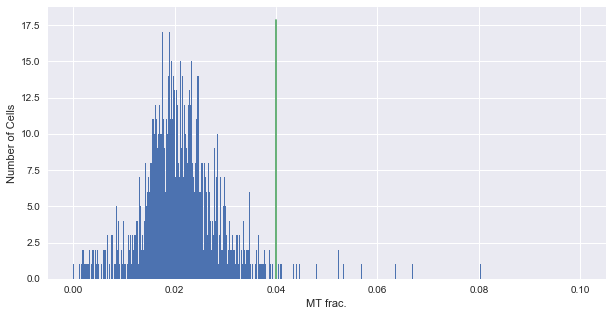

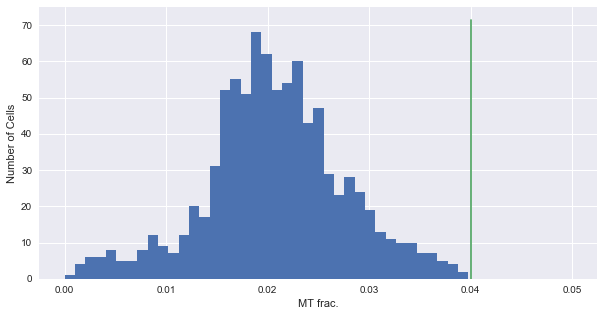

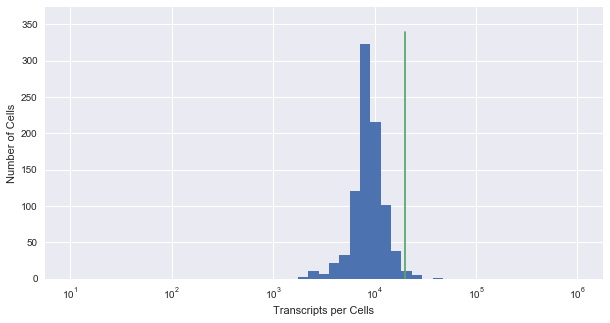

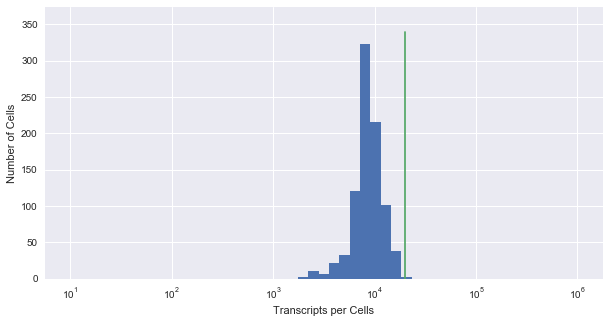

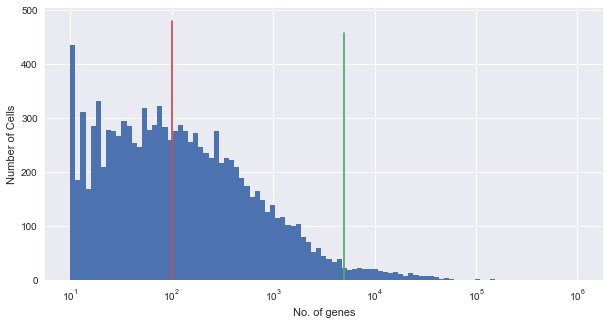

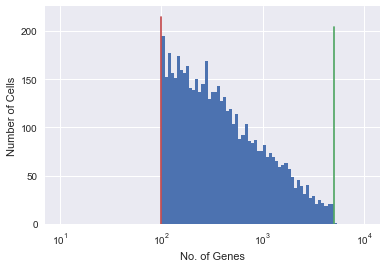

In [20]:
Efilttemp1 = mito_frac(E6WT,0.04)
Efiltemp2 = threshold(Efilttemp1[0],0,20000)
Efiltemp3= GeneCountGeneCoun (Efiltemp2[0],100,5000)
Efiltemp3[0].shape
E6WTfilt = Efiltemp3[0] 
#Taking care of the geneids/genenames.
genenametemp= np.zeros(len(Efiltemp3[1])).astype(object)
geneidstemp = np.zeros(len(Efiltemp3[1])).astype(object)
 
k = 0
for i in enumerate(Efiltemp3[1].flatten()):
    genenametemp[k] = gene_names6hpfWT[i[1]]
    geneidstemp[k] = gene_ids6hpfWT[i[1]]
    k = k + 1
    
#print (genenametemp.shape)
#print (geneidstemp.shape)
genename6WTfilt = genenametemp
geneids6WTfilt = geneidstemp


Mito fraction filter: 0.04
Pre-filter: 1556 Cells
Post-filter: 1515 Cells
Threshold min:0 max:20000
Pre-filter: 1515 Cells
Post-filter: 1499 Cells
GeneCount min:100 max:5000
Pre-filter: 25260 genes
Post-filter: 5796 genes


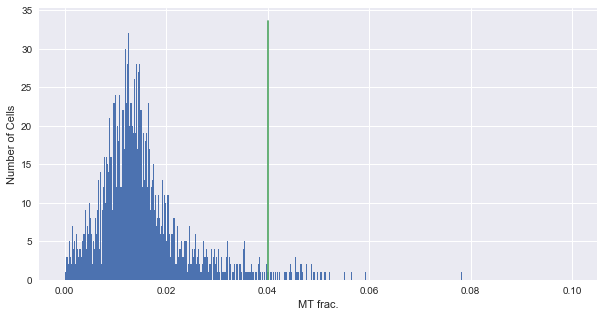

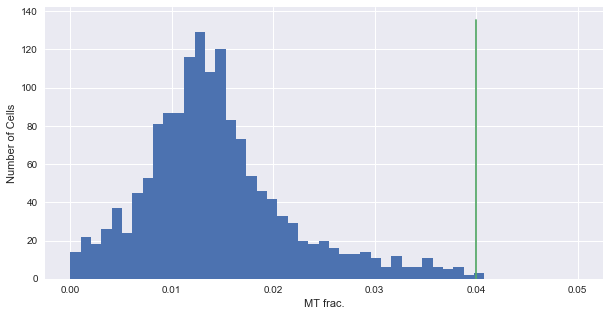

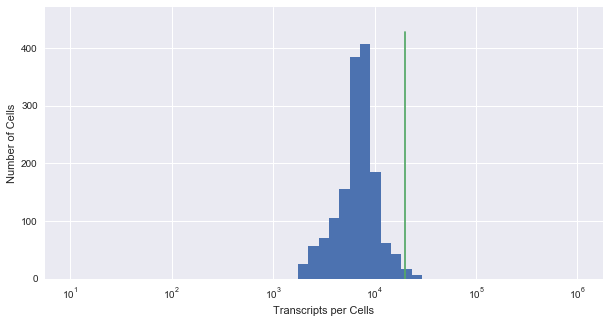

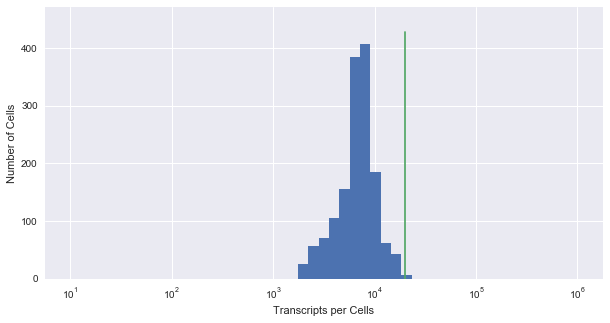

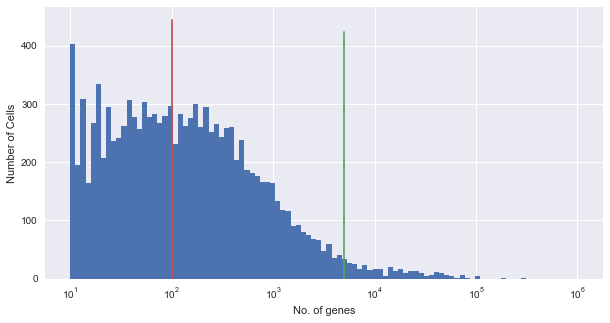

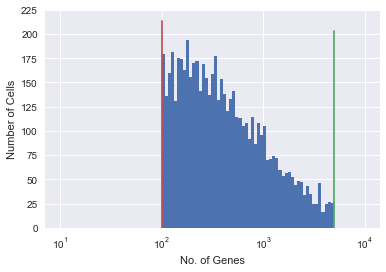

In [21]:
Efilttemp1 = mito_frac(E8WT,0.04)
Efiltemp2 = threshold(Efilttemp1[0],0,20000)
Efiltemp3= GeneCountGeneCoun (Efiltemp2[0],100,5000)
Efiltemp3[0].shape
E8WTfilt = Efiltemp3[0] 

#Taking care of the geneids/genenames.
genenametemp= np.zeros(len(Efiltemp3[1])).astype(object)
geneidstemp = np.zeros(len(Efiltemp3[1])).astype(object)
 
k = 0
for i in enumerate(Efiltemp3[1].flatten()):
    genenametemp[k] = gene_names8hpfWT[i[1]]
    geneidstemp[k] = gene_ids8hpfWT[i[1]]
    k = k + 1
    
#print (genenametemp.shape)
#print (geneidstemp.shape)
genename8WTfilt = genenametemp
geneids8WTfilt = geneidstemp

Mito fraction filter: 0.04
Pre-filter: 1435 Cells
Post-filter: 1431 Cells
Threshold min:0 max:20000
Pre-filter: 1431 Cells
Post-filter: 1431 Cells
GeneCount min:100 max:5000
Pre-filter: 25260 genes
Post-filter: 5351 genes


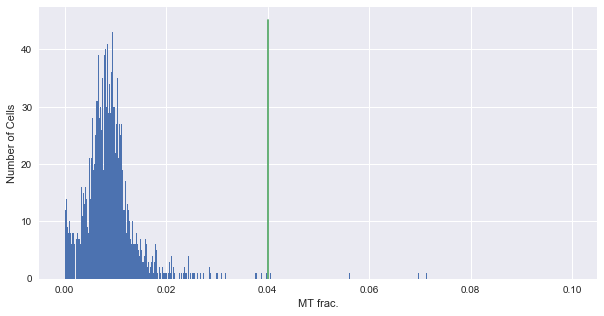

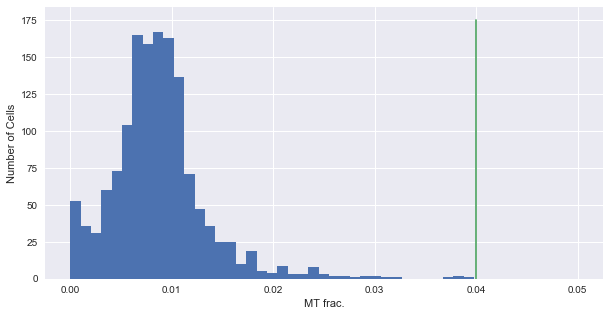

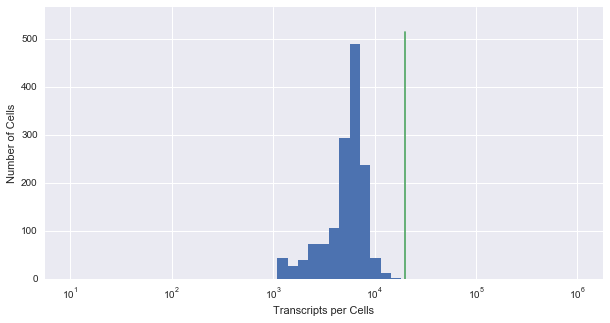

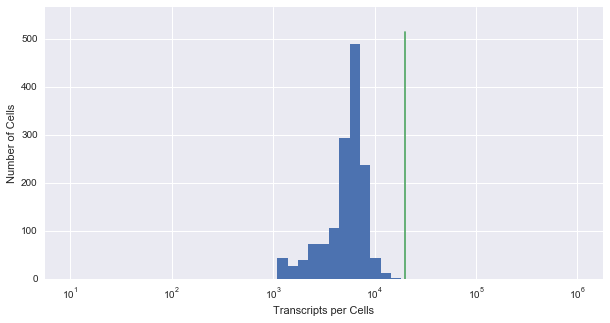

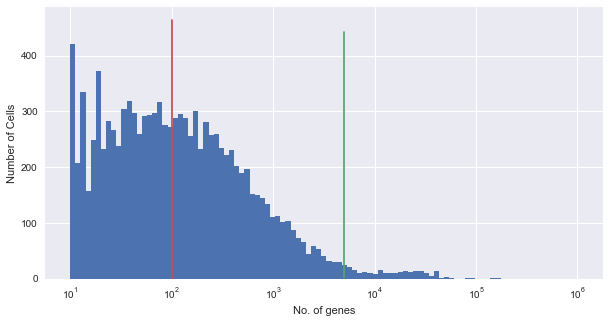

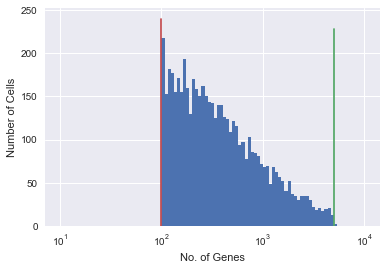

In [22]:
Efilttemp1 = mito_frac(E10WT,0.04)
Efiltemp2 = threshold(Efilttemp1[0],0,20000)
Efiltemp3= GeneCountGeneCoun (Efiltemp2[0],100,5000)
Efiltemp3[0].shape
E10WTfilt = Efiltemp3[0] 


#Taking care of the geneids/genenames.
genenametemp= np.zeros(len(Efiltemp3[1])).astype(object)
geneidstemp = np.zeros(len(Efiltemp3[1])).astype(object)
 
k = 0
for i in enumerate(Efiltemp3[1].flatten()):
    genenametemp[k] = gene_names10hpfWT[i[1]]
    geneidstemp[k] = gene_ids10hpfWT[i[1]]
    k = k + 1
    
#print (genenametemp.shape)
#print (geneidstemp.shape)
genename10WTfilt = genenametemp
geneids10WTfilt = geneidstemp

Mito fraction filter: 0.03
Pre-filter: 1640 Cells
Post-filter: 1622 Cells
Threshold min:0 max:20000
Pre-filter: 1622 Cells
Post-filter: 1522 Cells
GeneCount min:100 max:5000
Pre-filter: 25260 genes
Post-filter: 6936 genes


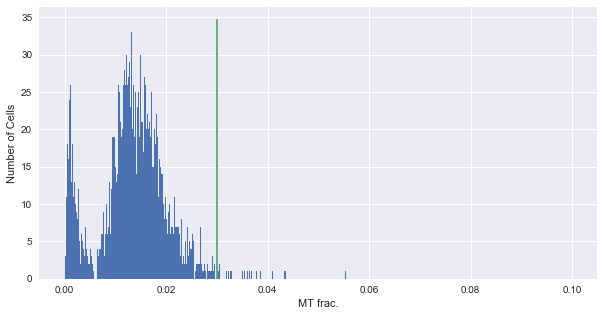

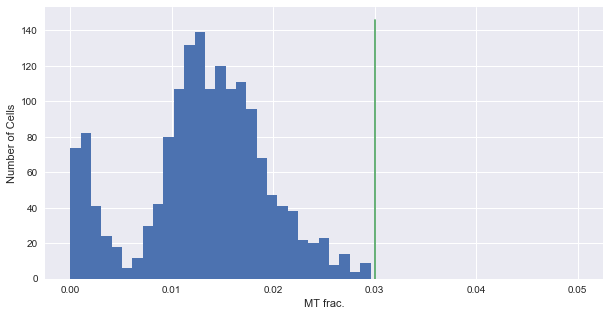

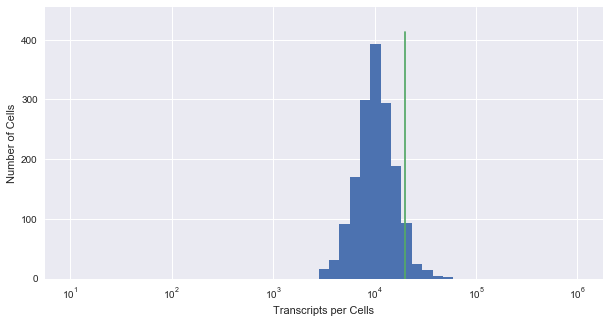

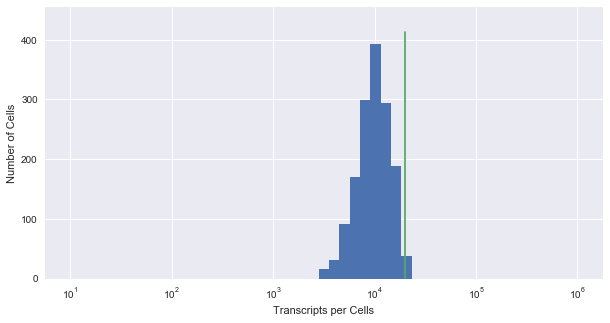

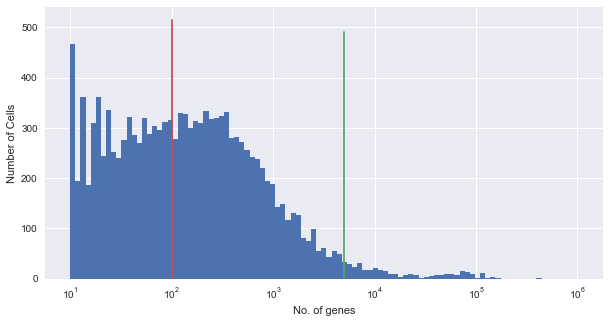

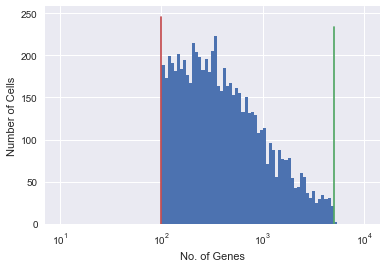

In [23]:
Efilttemp1 = mito_frac(E13WT,0.03)
Efiltemp2 = threshold(Efilttemp1[0],0,20000)
Efiltemp3= GeneCountGeneCoun (Efiltemp2[0],100,5000)
Efiltemp3[0].shape
E13WTfilt = Efiltemp3[0] 

#Taking care of the geneids/genenames.
genenametemp= np.zeros(len(Efiltemp3[1])).astype(object)
geneidstemp = np.zeros(len(Efiltemp3[1])).astype(object)
 
k = 0
for i in enumerate(Efiltemp3[1].flatten()):
    genenametemp[k] = gene_names13hpfWT[i[1]]
    geneidstemp[k] = gene_ids13hpfWT[i[1]]
    k = k + 1
    
#print (genenametemp.shape)
#print (geneidstemp.shape)
genename13WTfilt = genenametemp
geneids13WTfilt = geneidstemp

Mito fraction filter: 0.03
Pre-filter: 1985 Cells
Post-filter: 1869 Cells
Threshold min:0 max:20000
Pre-filter: 1869 Cells
Post-filter: 1848 Cells
GeneCount min:100 max:5000
Pre-filter: 25260 genes
Post-filter: 7237 genes


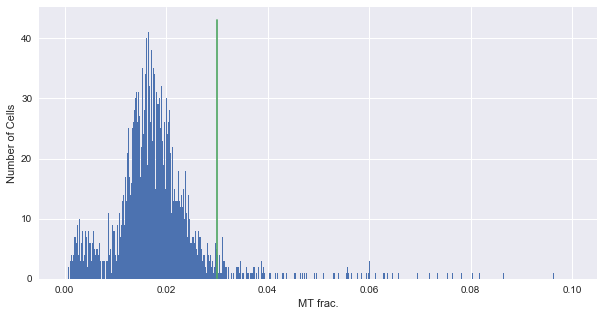

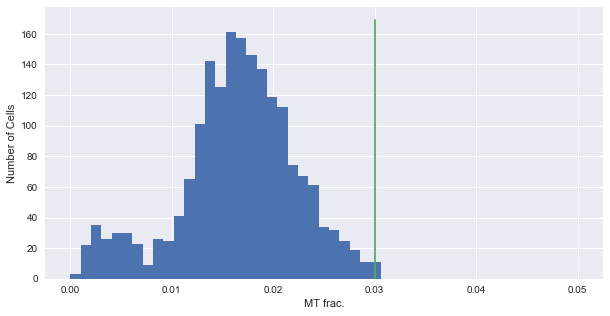

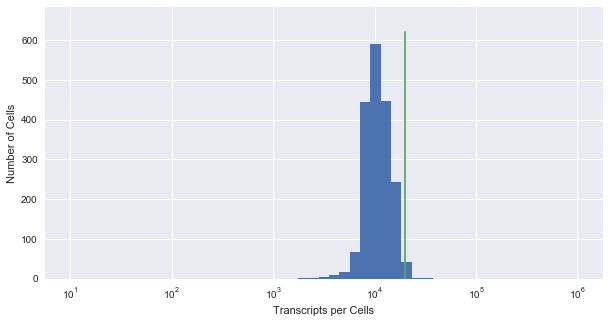

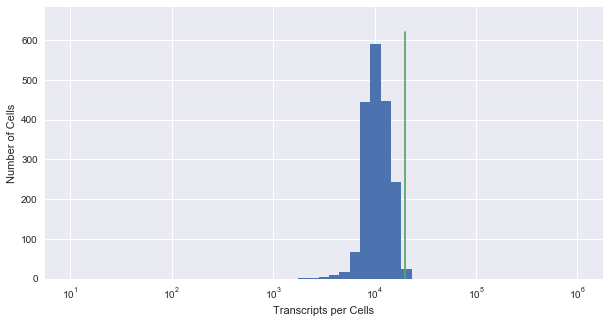

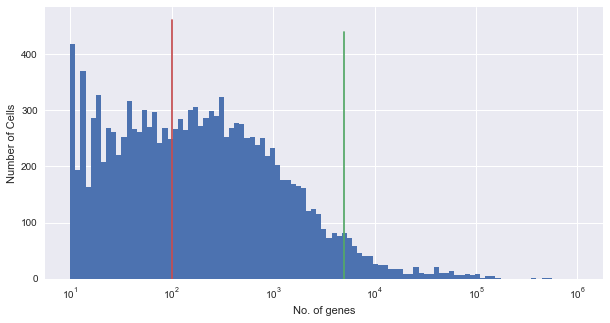

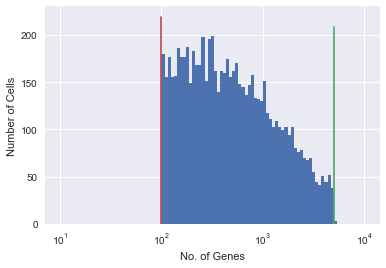

In [24]:
Efilttemp1 = mito_frac(E8gata56KD,0.03)
Efiltemp2 = threshold(Efilttemp1[0],0,20000)
Efiltemp3= GeneCountGeneCoun (Efiltemp2[0],100,5000)
Efiltemp3[0].shape
E8gata56KDfilt = Efiltemp3[0] 

#Taking care of the geneids/genenames.
genenametemp= np.zeros(len(Efiltemp3[1])).astype(object)
geneidstemp = np.zeros(len(Efiltemp3[1])).astype(object)
 
k = 0
for i in enumerate(Efiltemp3[1].flatten()):
    genenametemp[k] = gene_names8hpf_gata56KD[i[1]]
    geneidstemp[k] = gene_ids8hpf_gata56KD[i[1]]
    k = k + 1
    
#print (genenametemp.shape)
#print (geneidstemp.shape)
genename8gata56KDfilt = genenametemp
geneids8gata56KDfilt = geneidstemp

Mito fraction filter: 0.03
Pre-filter: 1910 Cells
Post-filter: 1840 Cells
Threshold min:0 max:20000
Pre-filter: 1840 Cells
Post-filter: 1815 Cells
GeneCount min:100 max:5000
Pre-filter: 25260 genes
Post-filter: 6563 genes


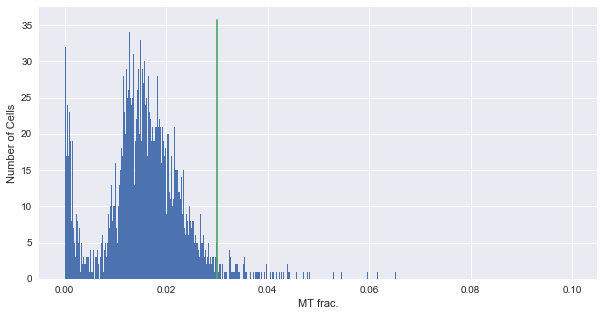

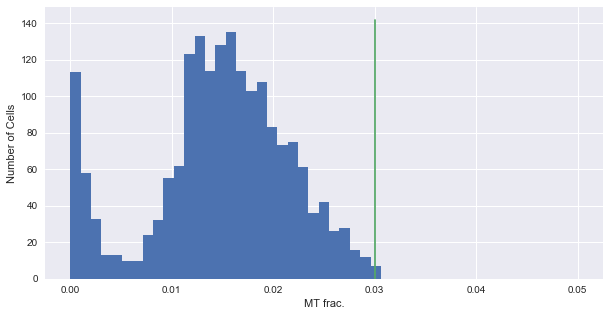

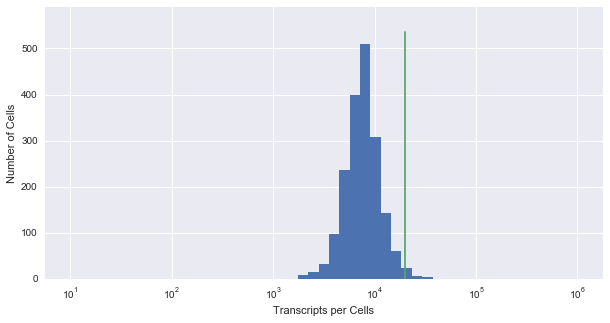

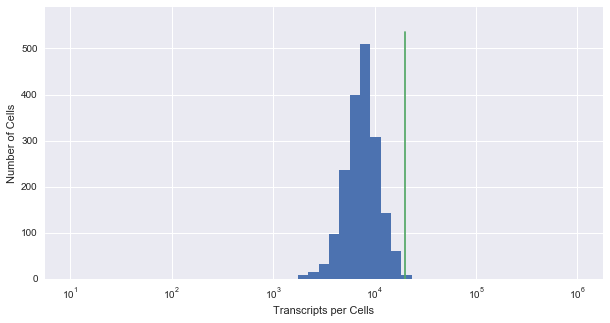

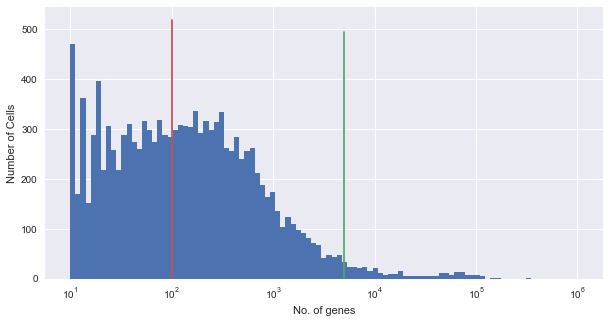

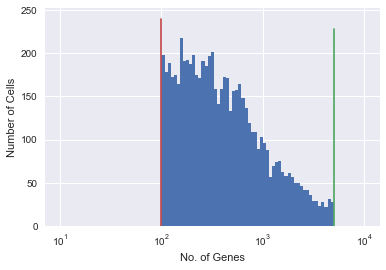

In [25]:
Efilttemp1 = mito_frac(E13gata56KD,0.03)
Efiltemp2 = threshold(Efilttemp1[0],0,20000)
Efiltemp3= GeneCountGeneCoun (Efiltemp2[0],100,5000)
Efiltemp3[0].shape
E13gata56KDfilt = Efiltemp3[0]


#Taking care of the geneids/genenames.
genenametemp= np.zeros(len(Efiltemp3[1])).astype(object)
geneidstemp = np.zeros(len(Efiltemp3[1])).astype(object)
 
k = 0
for i in enumerate(Efiltemp3[1].flatten()):
    genenametemp[k] = gene_names13hpf_gata56KD[i[1]]
    geneidstemp[k] = gene_ids13hpf_gata56KD[i[1]]
    k = k + 1
    
#print (genenametemp.shape)
#print (geneidstemp.shape)
genename13gata56KDfilt = genenametemp
geneids13gata56KDfilt = geneidstemp

In [26]:
cellgenetimeGata56KDfilt = {'Times': [8,13],'Time point': [  '8 hpf Gata56KD',   '13 hpf Gata56KD', ] , 'Genes # (pre-filt)':[len(datamat8hpf_gata56KD[:]), len(datamat13hpf_gata56KD[:])] , 'Genes # (post-filt)':[len(E8gata56KDfilt.T[:]), len(E13gata56KDfilt.T[:]) ]  , 'Cells # (pre-filt)': [len(datamat8hpf_gata56KD[0]) ,len(datamat13hpf_gata56KD[0]) ] ,'Cells # (post-filt)': [len(E8gata56KDfilt[:]) , len(E13gata56KDfilt[:]) ]}
dfGataKDfilt = pd.DataFrame(data=cellgenetimeGata56KDfilt)
dfGataKDfilt

,Times,Time point,Genes # (pre-filt),Genes # (post-filt),Cells # (pre-filt),Cells # (post-filt)
0,8,8 hpf Gata56KD,25260,7237,1985,1848
1,13,13 hpf Gata56KD,25260,6563,1910,1815


In [27]:
cellgenetimeWTfilt = {'Times': [6,8,10,13],'Time point': ['6 hpf WT', '8 hpf WT', '10 hpf WT', '13 hpf WT', ] , 'Genes # (pre-filt)':[len(datamat6hpfWT[:]), len(datamat8hpfWT[:]) ,len(datamat10hpfWT[:]) ,len(datamat13hpfWT[:]) ] , 'Genes # (post-filt)':[len(E6WTfilt.T[:]), len(E8WTfilt.T[:]) ,len(E10WTfilt.T[:]) ,len(E13WTfilt.T[:]) ]  , 'Cells # (pre-filt)': [len(datamat6hpfWT[0]) , len(datamat8hpfWT[0]) , len(datamat10hpfWT[0]),len(datamat13hpfWT[0]) ] ,'Cells # (post-filt)': [len(E6WTfilt[:]) , len(E8WTfilt[:]) ,len(E10WTfilt[:]),len(E13WTfilt[:]) ]}
dfWTfilt = pd.DataFrame(data=cellgenetimeWTfilt)
dfWTfilt

,Times,Time point,Genes # (pre-filt),Genes # (post-filt),Cells # (pre-filt),Cells # (post-filt)
0,6,6 hpf WT,25260,5343,901,873
1,8,8 hpf WT,25260,5796,1556,1499
2,10,10 hpf WT,25260,5351,1435,1431
3,13,13 hpf WT,25260,6936,1640,1522


In [28]:
def abline(slope, intercept):
    """Plot a line from slope and intercept"""
    axes = plt.gca()
    x_vals = np.array(axes.get_xlim())
    y_vals = intercept + slope * x_vals
    plt.plot(x_vals, y_vals, '--' ,color = 'k' )
    
def Eall(E, dataname):
    sumcol = np.sum(E, axis=1)
    temp = (E/sumcol)
    stdE=np.array( np.std(temp,axis=0)  )
    meanE= np.array( (np.mean(temp,axis=0)))
    intercept = np.mean(np.log10(stdE/meanE) + 0.5*np.log10(meanE))

    #plt.scatter(np.log10(meanE) , np.log10( (stdE/meanE) ),  s=5)
    #abline(-0.5, intercept)
    #plt.hist(sumcol, 10)
    p1 = figure(
       tools="hover,pan,wheel_zoom,box_zoom,reset,save",
       title=print('Gene expression dispersion for' ,dataname),
       x_axis_label='Mean expression of genes', y_axis_label='std/mean value (Fano factor)', 
       background_fill_color="#E8DDCB")
    x = np.arange(-5,-2.5,0.1)
    y=-0.5*x + intercept
    
    x1 = np.log10(meanE).flatten()
    y1 = np.log10(stdE/meanE).flatten()
     
    r1 = p1.circle(x1,y1, fill_color=None, radius = 0.01)
    r0 = p1.line(x,y, line_color = 'red', line_width = 2.0)
    legend = Legend(items=[
            (" Poissonian data",   [r0]) ,
             ("Experimental data", [r1]) ,
                           ], location=(0, 500))
    p1.add_layout(legend, 'right')
    
    p2 = figure(title="Histogram of Library size",tools="hover,pan,wheel_zoom,box_zoom,reset,save",
            background_fill_color="#E8DDCB")

    hist, edges = np.histogram(sumcol, density=False, bins=10)


    p2.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:],
        fill_color="#036564", line_color="#033649")
    p2.legend.location = "center_right"
    p2.legend.background_fill_color = "darkgrey"
    p2.xaxis.axis_label = 'Size of library'
    p2.yaxis.axis_label = 'No. of Cells'

    show(gridplot(p1,p2, ncols=1, plot_width=600, plot_height=400))
    return()

In [29]:
Eall(E6WTfilt, 'E6WT data' )
Eall(E8WTfilt, 'E8WT data' )
Eall(E10WTfilt, 'E10WT data' )
Eall(E13WTfilt, 'E13WT data' )

Gene expression dispersion for E6WT data


Gene expression dispersion for E8WT data


Gene expression dispersion for E10WT data


Gene expression dispersion for E13WT data


()

In [121]:
Eall(E8gata56KDfilt, 'E8gata56KD')
Eall(E13gata56KDfilt, 'E13gata56KD')

Gene expression dispersion for E8gata56KD


Gene expression dispersion for E13gata56KD


()

In [31]:
#Top 1000 genes based on Fano factor calculation. 
def plotvariance(Tinorm,sigmasq):

    p1 = figure(
       tools="hover,pan,wheel_zoom,box_zoom,reset,save",
       title=print('Gene expression dispersion' ),
       x_axis_label='Mean expression of genes', y_axis_label='std/mean value ', 
       background_fill_color="#E8DDCB")
    stdE= sigmasq**0.5
    meanE= Tinorm
    intercept = np.mean(np.log10(stdE/meanE) + 0.5*np.log10(meanE))
    x = np.arange(-5,-2,0.1)
    y=-0.5*x + intercept
    
    x1 = np.log10(meanE).flatten() 
    y1 = np.log10(stdE/meanE).flatten() 
     
    r1 = p1.circle(x1,y1, fill_color=None, radius = 0.01)
    r0 = p1.line(x,y, line_color = 'red', line_width = 2.0)
    legend = Legend(items=[
            (" Poissonian data",   [r0]) ,
             ("Experimental data", [r1]) ,
                           ], location=(0, 500))
    p1.add_layout(legend, 'right')
    show(gridplot(p1,ncols=1, plot_width=600, plot_height=300) )
                 
    return()

def topgene(datamatold,datamat,gene_names,gene_ids,filename):
    datamat = np.asarray(datamat.T)
    cellid  =   np.ones((1,len(datamat[1,:]))) 
    sumcol  = np.empty(len(cellid[0,:]))
    sumcolold  = sumcol
   
    for i in range(len(cellid[0,:])):
        sumcolold[i] = sum(datamatold[:,i]) 
    
    nbinsold = (np.linspace(   np.log10(min(sumcolold) ),  np.log10(max(sumcolold)) ,10))
    
    for i in range(len(cellid[0,:])):
        sumcol[i] = sum(datamat[:,i]) 
    nbins = (np.linspace(   np.log10(min(sumcol) ),  np.log10(max(sumcol)) ,10))
 
    #Plotting library size distribution pre and post filtering
    p1 = figure(title="Histogram of Library size (unprocessed data)",tools="hover,pan,wheel_zoom,box_zoom,reset,save",
            background_fill_color="#E8DDCB")

    hist, edges = np.histogram(np.log10(sumcolold), density=False, bins=nbinsold)


    p1.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:],
        fill_color="#036564", line_color="#033649")
    p1.legend.location = "center_right"
    p1.legend.background_fill_color = "darkgrey"
    p1.xaxis.axis_label = 'Size of library'
    p1.yaxis.axis_label = 'No. of Cells'
    
    p2 = figure(title="Histogram of Library size (post-processing)",tools="hover,pan,wheel_zoom,box_zoom,reset,save",
            background_fill_color="#E8DDCB")

    hist, edges = np.histogram(np.log10(sumcol), density=False, bins=nbins)


    p2.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:],
        fill_color="#036564", line_color="#033649")
    p2.legend.location = "center_right"
    p2.legend.background_fill_color = "darkgrey"
    p2.xaxis.axis_label = 'Size of library'
    p2.yaxis.axis_label = 'No. of Cells'

    
    
    npar = 10**(np.linspace(  log10(max(sumcol)), log10(min(sumcol)),10))
    
    cbin1=[]
    cbin2=[]
    cbin3=[]
    cbin4=[]
    cbin5=[] 
    cbin6=[]
    cbin7=[]
    cbin8=[]
    cbin9=[]
    cbin10=[]
    for i in range(len(sumcol[:])):
            if (np.log10(sumcol[i])  < np.log10(npar[len(npar) -1 ])):
                cbin1 = np.append(i,cbin1)
            elif  (np.log10(sumcol[i])  < np.log10(npar[len(npar)-2])) & (np.log10(sumcol[i]) > np.log10(npar[len(npar)-1])):
                cbin2 = np.append(i,cbin2) 
            elif  (np.log10(sumcol[i])  < np.log10(npar[len(npar)-3])) & (np.log10(sumcol[i]) > np.log10(npar[len(npar)-2])):
                cbin3 = np.append(i,cbin3)
            elif  (np.log10(sumcol[i])  < np.log10(npar[len(npar)-4])) & (np.log10(sumcol[i]) > np.log10(npar[len(npar)-3])):
                cbin4 = np.append(i,cbin4)
            elif  (np.log10(sumcol[i])  < np.log10(npar[len(npar)-5])) & (np.log10(sumcol[i]) > np.log10(npar[len(npar)-4])):
                cbin5 = np.append(i,cbin5)
            elif  (np.log10(sumcol[i])  < np.log10(npar[len(npar)-6])) & (np.log10(sumcol[i]) > np.log10(npar[len(npar)-5])):
                cbin6 = np.append(i,cbin6)
            elif  (np.log10(sumcol[i])  < np.log10(npar[len(npar)-7])) & (np.log10(sumcol[i]) > np.log10(npar[len(npar)-6])):
                cbin7 = np.append(i,cbin7)   
            elif  (np.log10(sumcol[i])  < np.log10(npar[len(npar)-8])) & (np.log10(sumcol[i]) > np.log10(npar[len(npar)-7])):
                cbin8 = np.append(i,cbin8)
            elif  (np.log10(sumcol[i])  < np.log10(npar[len(npar)-9])) & (np.log10(sumcol[i]) > np.log10(npar[len(npar)-8])):
                cbin9 = np.append(i,cbin9)
            else:
                cbin10 = np.append(i,cbin10)
                
    cbinno= [len(cbin1), len(cbin2), len(cbin3), len(cbin4) , len(cbin5) , len(cbin6), len(cbin7), len(cbin8),len(cbin9), len(cbin10)]
    
    
    Ndatamat1=np.zeros((len(datamat[:,0]),len(cbin1)))
    for i in range(len(cbin1)):
        j = int(cbin1[i-1])
        Ndatamat1[:,i] = datamat[:,j]/ sumcol[j] 
    
    Ndatamat2=np.zeros((len(datamat[:,0]),len(cbin2)))
    for i in range(len(cbin2)):
        j = int(cbin2[i-1])
        Ndatamat2[:,i] = datamat[:,j] / sumcol[j] 
 

    Ndatamat3=np.zeros((len(datamat[:,0]),len(cbin3)))
    for i in range(len(cbin3)):
        j = int(cbin3[i-1])
        Ndatamat3[:,i] = datamat[:,j] / sumcol[j] 

    Ndatamat4=np.zeros((len(datamat[:,0]),len(cbin4)))
    for i in range(len(cbin4)):
        j = int(cbin4[i-1])
        Ndatamat4[:,i] = datamat[:,j] / sumcol[j] 

    Ndatamat5=np.zeros((len(datamat[:,0]),len(cbin5)))
    for i in range(len(cbin5)):
        j = int(cbin5[i-1])
        Ndatamat5[:,i] = datamat[:,j] / sumcol[j] 

    Ndatamat6=np.zeros((len(datamat[:,0]),len(cbin6)))
    for i in range(len(cbin6)):
        j = int(cbin6[i-1])
        Ndatamat6[:,i] = datamat[:,j] / sumcol[j] 
    
    Ndatamat7=np.zeros((len(datamat[:,0]),len(cbin7)))
    for i in range(len(cbin7)):
        j = int(cbin7[i-1])
        Ndatamat7[:,i] = datamat[:,j] / sumcol[j] 
    
    Ndatamat8=np.zeros((len(datamat[:,0]),len(cbin8)))
    for i in range(len(cbin8)):
        j = int(cbin8[i-1])
        Ndatamat8[:,i] = datamat[:,j] / sumcol[j] 
    
    Ndatamat9=np.zeros((len(datamat[:,0]),len(cbin9)))
    for i in range(len(cbin9)):
        j = int(cbin9[i-1])
        Ndatamat9[:,i] = datamat[:,j] / sumcol[j] 
    
    Ndatamat10=np.zeros((len(datamat[:,0]),len(cbin10)))
    for i in range(len(cbin10)):
        j = int(cbin10[i-1])
        Ndatamat10[:,i] = datamat[:,j] / sumcol[j] 
    
    #Calculating mean expressions
    Tinorm3= np.zeros((len(Ndatamat3), 1))
    for i in range(len(datamat)):
        Tinorm3[i,0]= sum(Ndatamat3[i,:])/len(Ndatamat3[0,:])
    
    Tinorm4= np.zeros((len(Ndatamat4), 1))
    for i in range(len(datamat)):
        Tinorm4[i,0]= sum(Ndatamat4[i,:])/len(Ndatamat4[0,:])
        
    Tinorm5= np.zeros((len(Ndatamat5), 1))
    for i in range(len(datamat)):
        Tinorm5[i,0]= sum(Ndatamat5[i,:])/len(Ndatamat5[0,:])

    Tinorm6= np.zeros((len(datamat), 1))
    for i in range(len(datamat)):
        Tinorm6[i,0]= sum(Ndatamat6[i,:])/len(Ndatamat6[0,:]) 

    Tinorm7= np.zeros((len(datamat), 1))
    for i in range(len(datamat)):
        Tinorm7[i,0]= sum(Ndatamat7[i,:])/len(Ndatamat7[0,:])  
    
    Tinorm8= np.zeros((len(Ndatamat8), 1))
    for i in range(len(Ndatamat8)):
        Tinorm8[i,0]= sum(Ndatamat8[i,:])/len(Ndatamat8[0,:]) 

    Tinorm9= np.zeros((len(Ndatamat9), 1))
    for i in range(len(Ndatamat9)):
        Tinorm9[i,0]= sum(Ndatamat9[i,:])/len(Ndatamat9[0,:])
    
    #Calculating Squared Variance in each bin
    sigmasq3 = np.empty((len(Ndatamat3),1))
    for j in range(len(datamat)):
        sigmasq3[j,0] = np.average(Ndatamat3 [j,:]  * Ndatamat3 [j,:]) -   Tinorm3[j] *   Tinorm3[j]
    
    sigmasq4 = np.empty((len(Ndatamat4),1))
    for j in range(len(datamat)):
        sigmasq4[j,0] = np.average(Ndatamat4 [j,:]  * Ndatamat4 [j,:]) -   Tinorm4[j] *   Tinorm4[j]
    
    sigmasq5 = np.empty((len(Ndatamat5),1))
    for j in range(len(datamat)):
        sigmasq5[j,0] = np.average(Ndatamat5 [j,:]  * Ndatamat5 [j,:]) -   Tinorm5[j] *   Tinorm5[j]
    
    sigmasq6 = np.empty((len(Ndatamat6),1))
    for j in range(len(Ndatamat6)):
        sigmasq6[j,0] = np.average(Ndatamat6 [j,:]  * Ndatamat6 [j,:]) -   Tinorm6[j] *   Tinorm6[j]
 
    sigmasq7 = np.empty((len(Ndatamat7),1))
    for j in range(len(Ndatamat7)):
        sigmasq7[j,0] = np.average(Ndatamat7 [j,:]  * Ndatamat7 [j,:]) -   Tinorm7[j] *   Tinorm7[j]
    
    sigmasq8 = np.empty((len(Ndatamat8),1))
    for j in range(len(Ndatamat8)):
        sigmasq8[j,0] = np.average(Ndatamat8 [j,:]  * Ndatamat8 [j,:]) -   Tinorm8[j] *   Tinorm8[j] 
    

    sigmasq9 = np.empty((len(Ndatamat9),1))
    for j in range(len(Ndatamat9)):
        sigmasq9[j,0] = np.average(Ndatamat9 [j,:]  * Ndatamat9 [j,:]) -   Tinorm9[j] *   Tinorm9[j] 
   
    show(gridplot(p1,p2,ncols=1, plot_width=600, plot_height=300) ) 
    print (cbinno)
    #print ('Bin data: 4','No. of Cells in bin =' , len(cbin4))
    #plotvariance(Tinorm4,sigmasq4)
    #print ('Bin data: 5', 'No. of Cells in bin =' , len(cbin5))
    #plotvariance(Tinorm5,sigmasq5)
    print ('Bin data: 6','No. of Cells in bin =' , len(cbin6))
    plotvariance(Tinorm6,sigmasq6)
    print ('Bin data 7','No. of Cells in bin =' , len(cbin7))
    plotvariance(Tinorm7,sigmasq7)
    print ('Bin data: 8','No. of Cells in bin =' , len(cbin8))
    plotvariance(Tinorm8,sigmasq8)
    print ('Bin data 9','No. of Cells in bin =' , len(cbin9))
    plotvariance(Tinorm9,sigmasq9)
    

    
                    
    p3 = figure(
       tools="hover,pan,wheel_zoom,box_zoom,reset,save",
       title=print('Thresholding Gene expression dispersion' ),
       x_axis_label='log10(Mean)', y_axis_label='log10(Std/Mean) + 0.5* log10(Mean)', 
       background_fill_color="#E8DDCB")

    stdE6= sigmasq6**0.5
    meanE6= Tinorm6           
    stdE7= sigmasq7**0.5
    meanE7= Tinorm7 
    stdE8= sigmasq8**0.5
    meanE8= Tinorm8
    intercept1 = np.mean(np.log10(stdE6/meanE6) + 0.5*np.log10(meanE6))
    intercept2 = np.mean(np.log10(stdE7/meanE7) + 0.5*np.log10(meanE7))
    intercept3 = np.mean(np.log10(stdE7/meanE8) + 0.5*np.log10(meanE8))
    x = np.arange(-5,-2,0.1)
    y=0*x + 0.95*((intercept1 + intercept2 + intercept3)/3)
    
    x1 = np.log10(meanE6).flatten() 
    y1 = np.log10(stdE6/meanE6).flatten()       + 0.5*np.log10(meanE6).flatten()
    x2 = np.log10(meanE7).flatten() 
    y2 = np.log10(stdE7/meanE7).flatten() + 0.5*np.log10(meanE7).flatten()
    x3 = np.log10(meanE8).flatten() 
    y3 = np.log10(stdE8/meanE8).flatten() + 0.5*np.log10(meanE8).flatten()
     
    r1 = p3.circle(x1,y1, fill_alpha=0.2, color='blue', radius = 0.01)
    r2 = p3.circle(x2,y2, fill_alpha=0.2, color='green', radius = 0.01)
    r3 = p3.circle(x3,y3, fill_alpha=0.2, color='yellow', radius = 0.01)
    r0 = p3.line(x,y, line_color = 'red', line_width = 2.0)
    
    legend = Legend(items=[
            (" Poissonian data",   [r0]) ,
             ("Experimental data", [r1,r2,r3]) ,
                           ], location=(0, 500))
    p3.add_layout(legend, 'right')
    show(gridplot(p3,ncols=1, plot_width=600, plot_height=300) )
    
    
    
    threshold = 0.95*((intercept1 + intercept2 + intercept3)/3)
    genebin6list =  np.array([])
    genebin7list =  np.array([])
    genebin8list =  np.array([]) 
 
    for i in range(0,len(Tinorm6)):        
        if Tinorm6[i,0] != 0:
            dummy1 =  (np.log10 ((sigmasq6[i,0]**0.5)/Tinorm6[i,0]  ) + 0.5*np.log10( Tinorm6[i,0]) ) 
            if dummy1 > threshold:
                genebin6list = np.append(genebin6list,i) 
            
        if Tinorm7[i,0] != 0:
            dummy2 =  (np.log10 ((sigmasq7[i,0]**0.5)/Tinorm7[i,0]  ) + 0.5*np.log10( Tinorm7[i,0]) ) 
            if dummy2 > threshold:
                genebin7list = np.append(genebin7list,i) 
            
        
        if Tinorm8[i,0] != 0:
            dummy3 =  (np.log10 ((sigmasq8[i,0]**0.5)/Tinorm8[i,0]  ) + 0.5*np.log10( Tinorm8[i,0]) ) 
            if dummy3 > threshold:
                genebin8list = np.append(genebin8list,i) 
                
    genelistall = np.unique(np.concatenate((genebin6list,genebin7list,genebin8list), 0)).astype(int) 
            
    allgenes =  np.array([])
    for i in range(0,len(genelistall)): 
            allgenes = np.append(allgenes,gene_names[i])            
    
    
    allgeneids = np.array([])
    for i in range(0,len(genelistall)):
             allgeneids = np.append( allgeneids , gene_ids[genelistall[i]])
    
    dfgenedata= pd.DataFrame({'gene_ids': allgeneids })
    dfgenedata ['gene_names'] = allgenes
    
    
    Fanofactor6 = np.nan_to_num( sigmasq6/Tinorm6) 
    Fanofactor7 = np.nan_to_num( sigmasq7/Tinorm7) 
    Fanofactor8 = np.nan_to_num( sigmasq8/Tinorm8) 
    
    selectedFN6 = np.array([])
    for i in range(0,len(genelistall)):
        selectedFN6 = np.append( selectedFN6 , Fanofactor6[genelistall[i]])
    selectedFN7 = np.array([])
    for i in range(0,len(genelistall)):
        selectedFN7 = np.append( selectedFN7 , Fanofactor7[genelistall[i]])
    selectedFN8 = np.array([])
    for i in range(0,len(genelistall)):
        selectedFN8 = np.append( selectedFN8 , Fanofactor8[genelistall[i]])
                
                
    dfgenedata['Fanofactor-6'] = selectedFN6
    dfgenedata['Mean Expression-6']= Tinorm6[genelistall] 
    dfgenedata['Variance of Expression-6']=sigmasq6[genelistall] 
    dfgenedata['normalized Variance-6'] = sigmasq6[genelistall]**0.5/ Tinorm6[genelistall] 
    
    dfgenedata['Fanofactor-7'] = selectedFN7
    dfgenedata['Mean Expression-7']= Tinorm7[genelistall] 
    dfgenedata['Variance of Expression-7']=sigmasq7[genelistall] 
    dfgenedata['normalized Variance-7'] = sigmasq7[genelistall]**0.5/ Tinorm7[genelistall] 
    
    dfgenedata['Fanofactor-8'] = selectedFN8
    dfgenedata['Mean Expression-8']= Tinorm8[genelistall] 
    dfgenedata['Variance of Expression-8']=sigmasq8[genelistall] 
    dfgenedata['normalized Variance-8'] = sigmasq8[genelistall]**0.5/ Tinorm8[genelistall] 
    
               
    df3 = pd.DataFrame({'gene_ids': gene_ids})
    df3['gene_names'] = gene_names 
    df3['Mean expression(B-6)'] = Tinorm6 
    df3['Variance(B-6)'] =  sigmasq6
    df3['Fano Factor (B-6)'] =  Fanofactor6


    df4 = pd.DataFrame({'gene_ids': gene_ids})
    df4['gene_names'] = gene_names 
    df4['Mean expression(B-7)'] = Tinorm7 
    df4['Variance(B-7)'] =  sigmasq7
    df4['Fano Factor (B-7)'] =  Fanofactor7

    df2 = pd.DataFrame({'gene_ids': gene_ids})
    df2['gene_names'] = gene_names 
    df2['Mean expression(B-8)'] = Tinorm8 
    df2['Variance(B-8)'] =  sigmasq8
    df2['Fano Factor (B-8)'] =  Fanofactor8

    # Create a Pandas Excel writer using XlsxWriter as the engine.
    writer = pd.ExcelWriter('filename.xlsx', engine='xlsxwriter')

    # Convert the dataframe to an XlsxWriter Excel object.
    dfgenedata.to_excel(writer, sheet_name='Sheet1')
    df3.to_excel(writer, sheet_name='Sheet2')
    df4.to_excel(writer, sheet_name='Sheet3')
    df2.to_excel(writer, sheet_name='Sheet4')
    
     # Close the Pandas Excel writer and output the Excel file.
    writer.save() 
    
    
    
        #Fano factor correlations
    print('Normalized Variance')
    import matplotlib as m
    dftemp =  dfgenedata[['normalized Variance-6', 'normalized Variance-7', 'normalized Variance-8']].copy()
    cdict = {
      'red'  :  ( (0.0, 0.25, .25), (0.02, .59, .59), (1., 1., 1.)),
      'green':  ( (0.0, 0.0, 0.0), (0.02, .45, .45), (1., .97, .97)),
      'blue' :  ( (0.0, 1.0, 1.0), (0.02, .75, .75), (1., 0.45, 0.45))
    }

    cm = m.colors.LinearSegmentedColormap('my_colormap', cdict, 1024)
    plt.matshow(dftemp.corr(), cmap=cm, vmin=0.75, vmax=1)
    plt.colorbar()
    plt.show()

    print('Fano Factor')
    import matplotlib as m
    dftemp =  dfgenedata[['Fanofactor-6', 'Fanofactor-7', 'Fanofactor-8']].copy()
    cdict = {
      'red'  :  ( (0.0, 0.25, .25), (0.02, .59, .59), (1., 1., 1.)),
      'green':  ( (0.0, 0.0, 0.0), (0.02, .45, .45), (1., .97, .97)),
      'blue' :  ( (0.0, 1.0, 1.0), (0.02, .75, .75), (1., 0.45, 0.45))
    }

    cm = m.colors.LinearSegmentedColormap('my_colormap', cdict, 1024)
    plt.matshow(dftemp.corr(), cmap=cm, vmin=0.75, vmax=1)
    plt.colorbar()
    plt.show()

    print('Mean expression')
    #Mean value correlations
    import matplotlib as m
    dftemp =  dfgenedata[['Mean Expression-6', 'Mean Expression-7', 'Mean Expression-8']].copy()
    cdict = {
      'red'  :  ( (0.0, 0.25, .25), (0.02, .59, .59), (1., 1., 1.)),
      'green':  ( (0.0, 0.0, 0.0), (0.02, .45, .45), (1., .97, .97)),
      'blue' :  ( (0.0, 1.0, 1.0), (0.02, .75, .75), (1., 0.45, 0.45))
    }

    cm = m.colors.LinearSegmentedColormap('my_colormap', cdict, 1024)
    plt.matshow(dftemp.corr(), cmap=cm, vmin=0.75, vmax=1)
    plt.colorbar()
    plt.show()


    print('Variance')
    #Mean value correlations
    import matplotlib as m
    dftemp =  dfgenedata[['Variance of Expression-6', 'Variance of Expression-7', 'Variance of Expression-8']].copy()
    cdict = {
      'red'  :  ( (0.0, 0.25, .25), (0.02, .59, .59), (1., 1., 1.)),
      'green':  ( (0.0, 0.0, 0.0), (0.02, .45, .45), (1., .97, .97)),
      'blue' :  ( (0.0, 1.0, 1.0), (0.02, .75, .75), (1., 0.45, 0.45))
    }

    cm = m.colors.LinearSegmentedColormap('my_colormap', cdict, 1024)
    plt.matshow(dftemp.corr(), cmap=cm, vmin=0.75, vmax=1)
    plt.colorbar()
    plt.show()
    #Pickling the pandas data frame
    dfgenedata.to_pickle(filename)
    df4.to_pickle(filename +'bin8')
    df3.to_pickle(filename +'bin7')
    df2.to_pickle(filename +'bin6')
   #More plots
    
    nbins1 = ( np.linspace(0.0002 ,  0.0006 ,10))

    p7 = figure(title="Fano factors of genes (post-processing)",tools="hover,pan,wheel_zoom,box_zoom,reset,save",
            background_fill_color="#E8DDCB")
    
    y = np.arange(0  , 1500 ,10)
    x1 = 0*y +  (Fanofactor7[1395]) 
    x2 = 0*y +  (Fanofactor7[4112] )  

    hist, edges = np.histogram( Fanofactor7[np.nonzero( Fanofactor7 )] , density=False , bins = nbins1 )
     
    r01= p7.line(x1, y   , color='red', line_width = 2.0  )
    r02= p7.line(x2, y , color='blue'  , line_width =2.0)
     
     
    
    legend = Legend(items=[
            (" Gata6",   [r01]) ,
             ("Gata5", [r02]) ,
                           ], location=(0, 500))
    p7.add_layout(legend, 'right')
    p7.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:],
        fill_color="#036564", fill_alpha = 0.45, line_color="#033649")
    p7.legend.location = "center_right"
    p7.legend.background_fill_color = "darkgrey"
    p7.xaxis.axis_label = 'Fano Factor'
    p7.yaxis.axis_label = 'No. of Genes'

    show(gridplot(p7,ncols=1, plot_width=600, plot_height=300) )
            
    nbins2 = np.linspace( np.log10 (min(Tinorm7)+0.00001 )  , np.log10(max(Tinorm7)) ,10)
    
    
    p6 = figure(title="Mean expression Tibar expression (post-processing)",tools="hover,pan,wheel_zoom,box_zoom,reset,save",
            background_fill_color="#E8DDCB")
    
    y = np.arange(0  , 1000 ,10)
    x1 = 0*y + np.log10(Tinorm7[1395]) 
    x2 = 0*y +   np.log10( Tinorm7[4112] )  

    hist, edges = np.histogram(  np.log10(Tinorm7[np.nonzero(Tinorm7)] ) , density=False , bins = nbins2 )
     
    r01= p6.line(x1, y   , color='red', line_width = 2.0  )
    r02= p6.line(x2, y , color='blue'  , line_width =2.0)
     
     
    
    legend = Legend(items=[
            (" Gata6",   [r01]) ,
             ("Gata5", [r02]) ,
                           ], location=(0, 500))
    p6.add_layout(legend, 'right')
    p6.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:],
        fill_color="#036564", fill_alpha = 0.45, line_color="#033649")
    p6.legend.location = "center_right"
    p6.legend.background_fill_color = "darkgrey"
    p6.xaxis.axis_label = 'Mean Variance'
    p6.yaxis.axis_label = 'No. of Genes'

    show(gridplot(p6,ncols=1, plot_width=600, plot_height=300) )
    
    
    
    
    normvar7 = sigmasq7**0.5/ Tinorm7
     
    nbins3 = (np.linspace( np.log10 (min(normvar7)+0.00001 )  , np.log10(max(normvar7)) ,10))
    
    
    p5 = figure(title="Norm. Variance expression (post-processing)",tools="hover,pan,wheel_zoom,box_zoom,reset,save",
            background_fill_color="#E8DDCB")
    
    y = np.arange(0  , 1500 ,10)
    x1 = 0*y + np.log10(normvar7[1395]) 
    x2 = 0*y +   np.log10( normvar7[4112] )  

    hist, edges = np.histogram( np.log10(normvar7[np.nonzero(normvar7)] ), density=False , bins = nbins3 )
     
    r01= p5.line(x1, y   , color='red', line_width = 2.0  )
    r02= p5.line(x2, y , color='blue'  , line_width =2.0)
     
     
    
    legend = Legend(items=[
            (" Gata6",   [r01]) ,
             ("Gata5", [r02]) ,
                           ], location=(0, 500))
    p5.add_layout(legend, 'right')
    p5.quad(top=hist, bottom=0, left=edges[:-1], right=edges[1:],
        fill_color="#036564", fill_alpha = 0.45, line_color="#033649")
    p5.legend.location = "center_right"
    p5.legend.background_fill_color = "darkgrey"
    p5.xaxis.axis_label = 'Normalized Variance'
    p5.yaxis.axis_label = 'No. of Genes'

    show(gridplot(p5,ncols=1, plot_width=600, plot_height=300) )
    
    
    
    return()

[0, 9, 4, 19, 35, 118, 350, 232, 85, 21]
Bin data: 6 No. of Cells in bin = 118
Gene expression dispersion


Bin data 7 No. of Cells in bin = 350
Gene expression dispersion


Bin data: 8 No. of Cells in bin = 232
Gene expression dispersion


Bin data 9 No. of Cells in bin = 85
Gene expression dispersion


Thresholding Gene expression dispersion


Normalized Variance


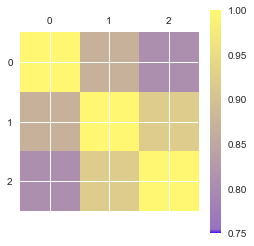

Fano Factor


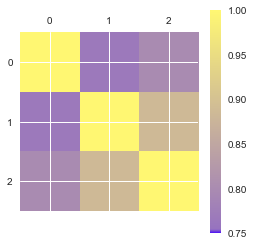

Mean expression


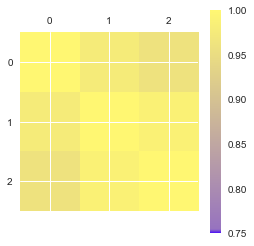

Variance


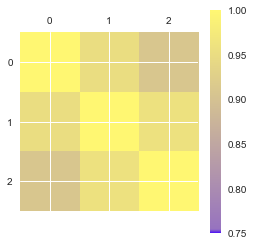

()

In [32]:
from IPython.display import HTML
HTML('''<script>
code_show_err=false; 
function code_toggle_err() {
 if (code_show_err){
 $('div.output_stderr').hide();
 } else {
 $('div.output_stderr').show();
 }
 code_show_err = !code_show_err
} 
$( document ).ready(code_toggle_err);
</script>
To toggle on/off output_stderr, click <a href="javascript:code_toggle_err()">here</a>.''')

topgene(datamat6hpfWT,E6WTfilt,genename6WTfilt,geneids6WTfilt, '6WTgenedata')




[0, 27, 56, 81, 155, 359, 499, 198, 85, 39]
Bin data: 6 No. of Cells in bin = 359
Gene expression dispersion


Bin data 7 No. of Cells in bin = 499
Gene expression dispersion


Bin data: 8 No. of Cells in bin = 198
Gene expression dispersion


Bin data 9 No. of Cells in bin = 85
Gene expression dispersion


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log10
  # This is added back by InteractiveShellApp.init_path()
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in log10
  from ipykernel import kernelapp as app
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in true_divide
  app.launch_new_instance()


Thresholding Gene expression dispersion


Normalized Variance


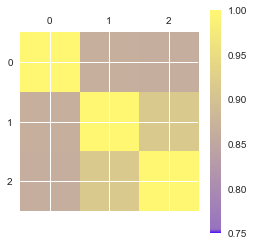

Fano Factor


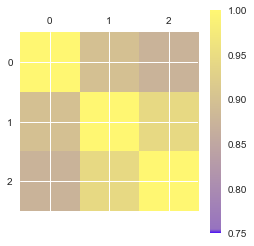

Mean expression


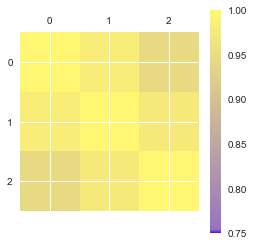

Variance


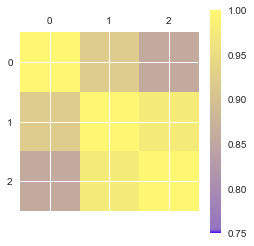

()

In [33]:
topgene(datamat8hpfWT,E8WTfilt,genename8WTfilt,geneids8WTfilt, '8WTgenedata')

In [34]:
topgene(datamat10hpfWT,E10WTfilt,genename10WTfilt,geneids10WTfilt, '10WTgenedata')

[0, 18, 47, 66, 93, 106, 472, 516, 97, 16]
Bin data: 6 No. of Cells in bin = 106
Gene expression dispersion


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log10
  # This is added back by InteractiveShellApp.init_path()
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in log10
  from ipykernel import kernelapp as app
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in true_divide
  app.launch_new_instance()


Bin data 7 No. of Cells in bin = 472
Gene expression dispersion


Bin data: 8 No. of Cells in bin = 516
Gene expression dispersion


Bin data 9 No. of Cells in bin = 97
Gene expression dispersion


Thresholding Gene expression dispersion


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:250: RuntimeWarning: invalid value encountered in true_divide
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:250: RuntimeWarning: divide by zero encountered in log10
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:256: RuntimeWarning: divide by zero encountered in log10
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:257: RuntimeWarning: invalid value encountered in true_divide
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:257: RuntimeWarning: divide by zero encountered in log10


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:314: RuntimeWarning: invalid value encountered in true_divide


ValueError: Cannot set a frame with no defined index and a value that cannot be converted to a Series

[0, 5, 17, 50, 116, 242, 375, 382, 244, 91]
Bin data: 6 No. of Cells in bin = 242
Gene expression dispersion


Bin data 7 No. of Cells in bin = 375
Gene expression dispersion


Bin data: 8 No. of Cells in bin = 382
Gene expression dispersion


Bin data 9 No. of Cells in bin = 244
Gene expression dispersion


Thresholding Gene expression dispersion


Normalized Variance


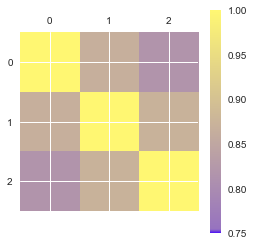

Fano Factor


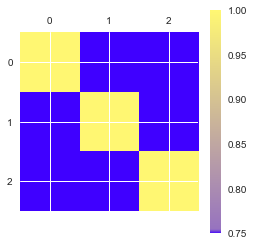

Mean expression


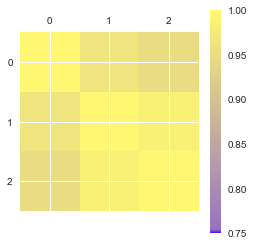

Variance


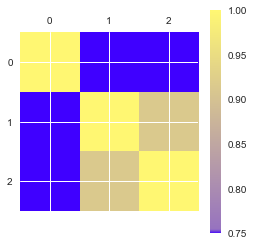

()

In [35]:
topgene(datamat13hpfWT,E13WTfilt,genename13WTfilt,geneids13WTfilt, '13WTgenedata')

In [36]:
topgene(datamat8hpf_gata56KD,E8gata56KDfilt,genename8gata56KDfilt,geneids8gata56KDfilt, '8gata56KDgenedata')

[0, 0, 2, 4, 8, 23, 369, 850, 509, 83]
Bin data: 6 No. of Cells in bin = 23
Gene expression dispersion


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: invalid value encountered in true_divide
  # This is added back by InteractiveShellApp.init_path()
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:11: RuntimeWarning: divide by zero encountered in log10
  # This is added back by InteractiveShellApp.init_path()
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:15: RuntimeWarning: divide by zero encountered in log10
  from ipykernel import kernelapp as app
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in true_divide
  app.launch_new_instance()


Bin data 7 No. of Cells in bin = 369
Gene expression dispersion


Bin data: 8 No. of Cells in bin = 850
Gene expression dispersion


Bin data 9 No. of Cells in bin = 509
Gene expression dispersion


Thresholding Gene expression dispersion


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:250: RuntimeWarning: invalid value encountered in true_divide
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:250: RuntimeWarning: divide by zero encountered in log10
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:256: RuntimeWarning: divide by zero encountered in log10
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:257: RuntimeWarning: invalid value encountered in true_divide
/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:257: RuntimeWarning: divide by zero encountered in log10


/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:314: RuntimeWarning: invalid value encountered in true_divide


ValueError: Cannot set a frame with no defined index and a value that cannot be converted to a Series

[0, 4, 19, 47, 128, 390, 643, 384, 160, 40]
Bin data: 6 No. of Cells in bin = 390
Gene expression dispersion


Bin data 7 No. of Cells in bin = 643
Gene expression dispersion


Bin data: 8 No. of Cells in bin = 384
Gene expression dispersion


Bin data 9 No. of Cells in bin = 160
Gene expression dispersion


Thresholding Gene expression dispersion


Normalized Variance


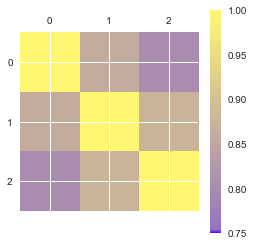

Fano Factor


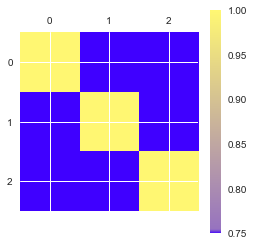

Mean expression


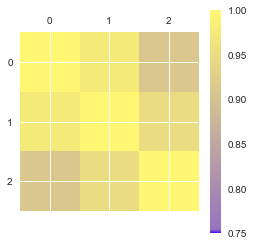

Variance


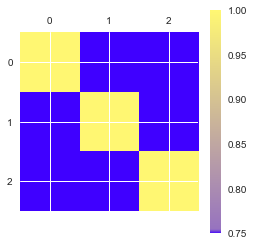

()

In [38]:
topgene(datamat13hpf_gata56KD,E13gata56KDfilt,genename13gata56KDfilt,geneids13gata56KDfilt, '13gata56KDgenedata')

In [39]:
df = pd.read_pickle('6WTgenedata')
 
#Top 100 genes
dftopgene = df[['gene_names','Fanofactor-6','normalized Variance-6']]

dftopgene['index value'] = dftopgene.index.values


dftopgene

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,gene_names,Fanofactor-6,normalized Variance-6,index value
0,lrp6,0.000530,4.216193,0
1,si:zfos-932h1.2,0.001720,1.640954,1
2,msgn1,0.000522,2.425622,2
3,mrps10,0.000578,2.644215,3
4,xpot,0.000517,0.992882,4
5,ost4,0.000520,1.311680,5
6,tmem214,0.000422,3.638156,6
7,mtpn,0.000484,2.820933,7
8,ripply2,0.000654,1.438816,8
9,nap1l1,0.000543,4.132895,9


In [1]:
def topgeneplot (df):

 
    #Top 100 genes
    dftopgene6 = df[['gene_names','Fanofactor-6','normalized Variance-6']]

    dftopgene6['index value'] = dftopgene6.index.values
    
    
   
    from bokeh.plotting import figure, ColumnDataSource, output_notebook, show 
    from bokeh.models import HoverTool, WheelZoomTool, PanTool, BoxZoomTool, ResetTool, TapTool, SaveTool, LabelSet
    from bokeh.palettes import brewer
    source = ColumnDataSource(dftopgene6)
    title = "Gene names with variance"
    #feeding data into ColumnDataSource


    #Editing the hover that need to displayed while hovering
    hover = HoverTool(tooltips=[('gene_names', '@gene_names')])

    #tools that are need to explote data




    tools = [hover, WheelZoomTool(), PanTool(), BoxZoomTool(), ResetTool(), SaveTool()]

    #finally making figure with scatter plot
    p = figure(tools=tools,title=title,plot_width=700,plot_height=400,toolbar_location='below',toolbar_sticky=True, )
    p.circle(x='index value',y='normalized Variance-6', source= source, size=5)
    labels = LabelSet(x='index value', y='normalized Variance-6', text='gene_names',
                      level='glyph', x_offset=5, y_offset=5,
                       source=source, render_mode='canvas', text_font_size =  "5pt")
    #displaying the graph


    p.add_layout(labels)
    show(p)
    return ()

In [62]:
df6 = pd.read_pickle('6WTgenedata')
topgeneplot(df6)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys


()

In [63]:
df = pd.read_pickle('8WTgenedata')
topgeneplot(df)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys


()

In [64]:
df = pd.read_pickle('10WTgenedata')
topgeneplot(df)

FileNotFoundError: [Errno 2] No such file or directory: '10WTgenedata'

In [65]:
df = pd.read_pickle('13WTgenedata')
topgeneplot(df)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys


()

In [66]:
df = pd.read_pickle('8gata56KDgenedata')
topgeneplot(df)

FileNotFoundError: [Errno 2] No such file or directory: '8gata56KDgenedata'

In [67]:
df = pd.read_pickle('13gata56KDgenedata')
topgeneplot(df)

/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys


()

In [78]:
def kmeansgapstats (transposed_data1):
    from sklearn.cluster import KMeans
    from sklearn.decomposition import PCA
    import scipy.stats as stats
    #Normalizing the data using standard scaler
    transposed_data = StandardScaler().fit_transform(transposed_data1)
    print ('Kmeans is done using specified no. of clusters')
    print ('For most sc-RNA seq data, PCA decomposition is done to first 20 or 50 components')
    pca = PCA(n_components=20)
    pca.fit(transposed_data)
    X_pca = pca.transform(transposed_data)
    print ( 'No. of PCA components used', len(X_pca[0]))
    print ( 'No. of cells used' , len(X_pca) )
    print ('Explained variation per principal component' , pca.explained_variance_ratio_  )
    
    import gap
    agbm= np.asarray(X_pca)
    gaps, s_k, K = gap.gap_statistic(agbm, refs=None, B=15, K=range(1,20), N_init = 20)
    bestKValue = gap.find_optimal_k(gaps, s_k, K)
    
    dfgaps = pd.DataFrame({'Gaps': gaps})
    dfgaps['Clusters'] = dfgaps.index.values
    
    from bokeh.plotting import figure, ColumnDataSource, output_notebook, show 
    from bokeh.models import HoverTool, WheelZoomTool, PanTool, BoxZoomTool, ResetTool, TapTool, SaveTool, LabelSet
    tools = [WheelZoomTool(), PanTool(), BoxZoomTool(), ResetTool(), SaveTool()]
    source  = ColumnDataSource(dfgaps)
    p7 = figure(tools=tools,title= print('Gaps Statistics' , 'Best value for k-means = ', bestKValue ),plot_width=700,plot_height=400,toolbar_location='below',toolbar_sticky=True, )
    r01= p7.circle(x='Clusters', y = 'Gaps' , radius = 0.025, color = 'red' , source = source )
    r02= p7.line(x='Clusters', y = 'Gaps'  , line_width = 2.0 ,  source = source )
    show(p7)
    print ('Best value for k-means = ', bestKValue)
    
    #Plotting the PCA Variance ratio as a function of the PCA components
    fig = plt.figure(figsize=(8,4))
    plt.xticks(np.arange(min(range(0,len(X_pca[0]))), max(range(0,len(X_pca[0])))+1, 1.0))
    plt.scatter( range(0,len(X_pca[0])), pca.explained_variance_ratio_ , c = 'red'  , s = 50 )
    plt.plot(range(0,len(X_pca[0])), pca.explained_variance_ratio_ ,  linestyle='dashed' , c = 'blue' , linewidth= 2  )
    plt.grid()
    plt.show()





    # Apply your clustering here
    print ('Kmeans, using 2 clusters')
    km = KMeans(n_clusters=2, init='k-means++',n_init=10, verbose=0);
    km.fit(transposed_data);
    cluster_pred = km.predict(transposed_data);
    centers2D = pca.transform(km.cluster_centers_);
    fig , ax = plt.subplots(figsize= (8,4))
    plt.scatter(X_pca[:,0], X_pca[:,1], c=cluster_pred,  cmap='gnuplot', s=20)
    plt.scatter(centers2D[:,0], centers2D[:,1], marker='s', s = 20 , c='red')
    start, end = ax.get_xlim()
    ax.xaxis.set_ticks(np.arange(start, end, (end-start)/10))
    ax.xaxis.set_major_formatter(ticker.FormatStrFormatter('%0.1f'))
    plt.grid()
    plt.show()


    print ('Kmeans, using 3 clusters')
    km = KMeans(n_clusters=3, init='k-means++',n_init=10, verbose=0);
    km.fit(transposed_data);
    cluster_pred = km.predict(transposed_data);
    centers2D = pca.transform(km.cluster_centers_);
    fig , ax = plt.subplots(figsize= (8,4))
    plt.scatter(X_pca[:,0], X_pca[:,1], c=cluster_pred, cmap='gnuplot', s=20)
    plt.scatter(centers2D[:,0], centers2D[:,1], marker='s', s = 20 , c='red')
    start, end = ax.get_xlim()
    ax.xaxis.set_ticks(np.arange(start, end, (end-start)/10))
    ax.xaxis.set_major_formatter(ticker.FormatStrFormatter('%0.1f'))
    plt.grid()
    plt.show()

    print ('Kmeans, using 5 clusters')
    km = KMeans(n_clusters=5, init='k-means++',n_init=10, verbose=0);
    km.fit(transposed_data);
    cluster_pred = km.predict(transposed_data);
    centers2D = pca.transform(km.cluster_centers_)
    fig , ax = plt.subplots(figsize= (8,4))
    plt.scatter(X_pca[:,0], X_pca[:,1], c=cluster_pred, cmap='gnuplot', s=20)
    plt.scatter(centers2D[:,0], centers2D[:,1], marker='s', s = 20 , c='red')
    start, end = ax.get_xlim()
    ax.xaxis.set_ticks(np.arange(start, end, (end-start)/10))
    ax.xaxis.set_major_formatter(ticker.FormatStrFormatter('%0.1f'))
    plt.grid()
    plt.show()

    return ()

/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


Kmeans is done using specified no. of clusters
For most sc-RNA seq data, PCA decomposition is done to first 20 or 50 components
No. of PCA components used 20
No. of cells used 873
Explained variation per principal component [0.05899415 0.01162983 0.00842757 0.0067728  0.005867   0.00362667
 0.00350952 0.00332537 0.00293228 0.00285579 0.00277989 0.00264952
 0.00257478 0.00252475 0.00250427 0.00244273 0.00241889 0.0023959
 0.00236148 0.00232694]
Gaps Statistics Best value for k-means =  5


Best value for k-means =  5


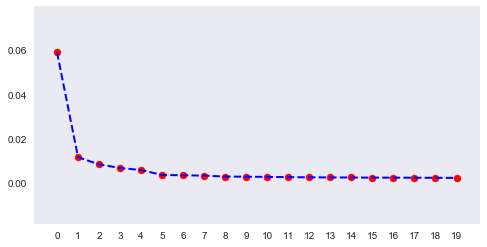

Kmeans, using 2 clusters


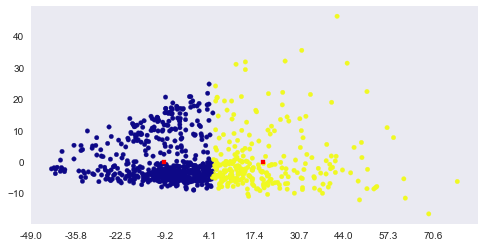

Kmeans, using 3 clusters


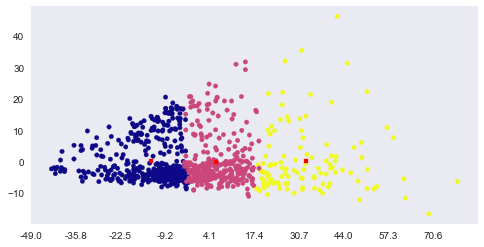

Kmeans, using 5 clusters


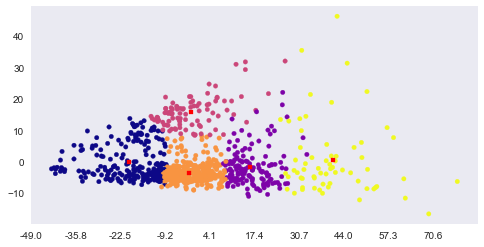

()

In [79]:
kmeansgapstats(E6WTfilt)

/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


Kmeans is done using specified no. of clusters
For most sc-RNA seq data, PCA decomposition is done to first 20 or 50 components
No. of PCA components used 20
No. of cells used 1499
Explained variation per principal component [0.05898959 0.01512487 0.00774271 0.00545919 0.00458492 0.00306219
 0.00288604 0.00256708 0.00237842 0.00228068 0.00219304 0.00217639
 0.00204517 0.00196949 0.00194273 0.00191742 0.00189214 0.00186755
 0.00185913 0.00182733]
Gaps Statistics Best value for k-means =  18


Best value for k-means =  18


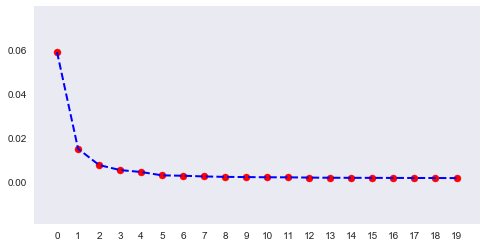

Kmeans, using 2 clusters


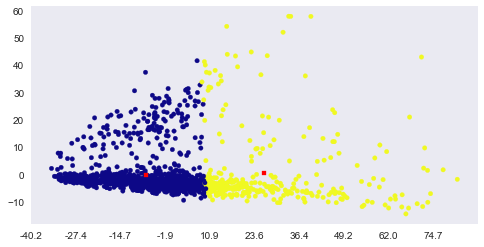

Kmeans, using 3 clusters


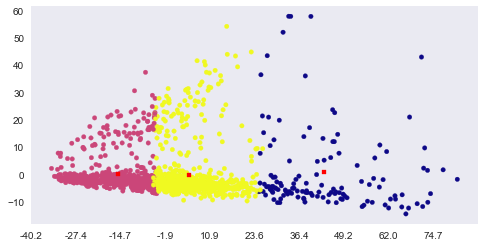

Kmeans, using 5 clusters


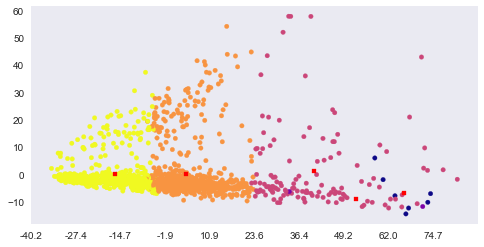

()

In [83]:
kmeansgapstats(E8WTfilt)

/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


Kmeans is done using specified no. of clusters
For most sc-RNA seq data, PCA decomposition is done to first 20 or 50 components
No. of PCA components used 20
No. of cells used 1431
Explained variation per principal component [0.04380174 0.02170953 0.00926619 0.00714238 0.00518742 0.00429785
 0.00396915 0.00319851 0.00310759 0.00302409 0.00267603 0.00261217
 0.00241002 0.0021875  0.00204717 0.00203189 0.00190215 0.00185695
 0.00178651 0.0017402 ]
Gaps Statistics Best value for k-means =  19


Best value for k-means =  19


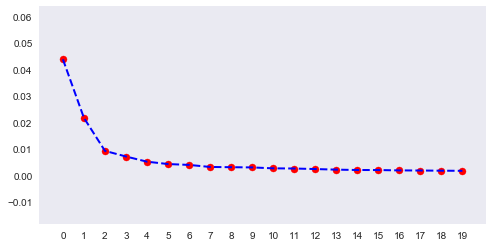

Kmeans, using 2 clusters


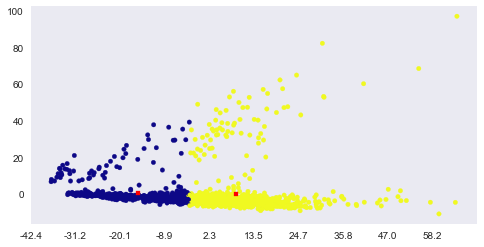

Kmeans, using 3 clusters


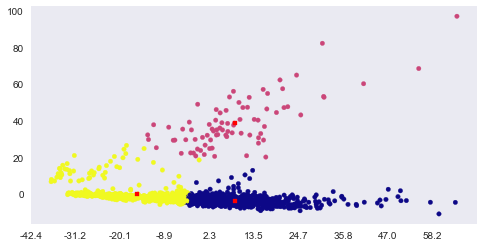

Kmeans, using 5 clusters


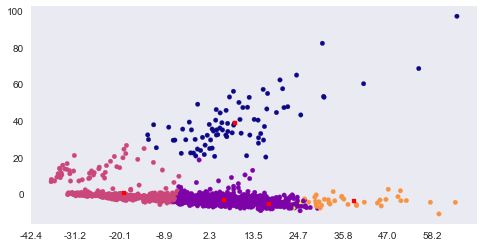

()

In [84]:
kmeansgapstats(E10WTfilt)

/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


Kmeans is done using specified no. of clusters
For most sc-RNA seq data, PCA decomposition is done to first 20 or 50 components
No. of PCA components used 20
No. of cells used 1522
Explained variation per principal component [0.04614932 0.01923424 0.01369249 0.00842176 0.0077069  0.00561166
 0.005253   0.00463556 0.00391862 0.00388097 0.00337318 0.00315987
 0.00269244 0.00262068 0.00232837 0.0022877  0.0022136  0.00207073
 0.00195875 0.0018582 ]
Gaps Statistics Best value for k-means =  18


Best value for k-means =  18


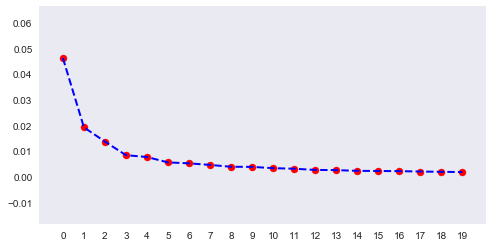

Kmeans, using 2 clusters


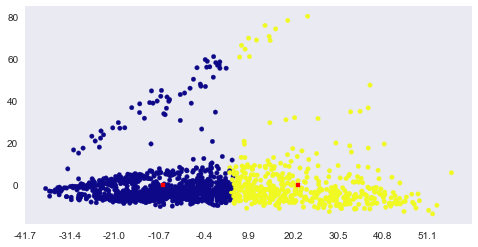

Kmeans, using 3 clusters


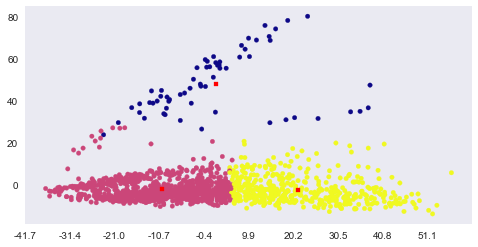

Kmeans, using 5 clusters


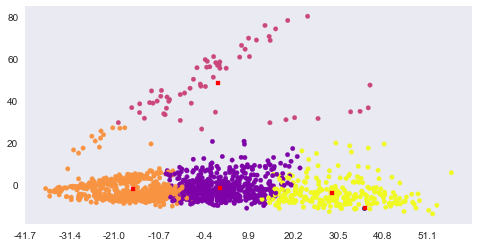

()

In [85]:
kmeansgapstats(E13WTfilt)

/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


Kmeans is done using specified no. of clusters
For most sc-RNA seq data, PCA decomposition is done to first 20 or 50 components
No. of PCA components used 20
No. of cells used 1848
Explained variation per principal component [0.02481649 0.01466589 0.00660397 0.00627257 0.00554361 0.00371293
 0.00350052 0.00284084 0.00251422 0.0023205  0.00215189 0.00200596
 0.00177778 0.00172343 0.00161964 0.00158446 0.00139681 0.00138512
 0.00133302 0.00129638]
Gaps Statistics Best value for k-means =  19


Best value for k-means =  19


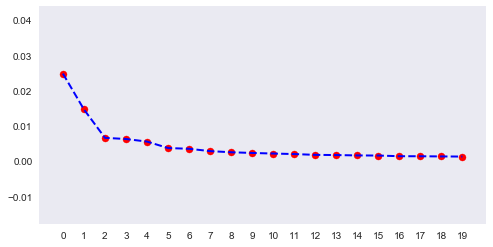

Kmeans, using 2 clusters


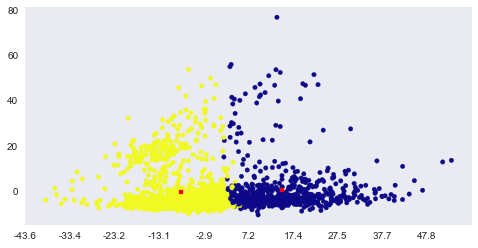

Kmeans, using 3 clusters


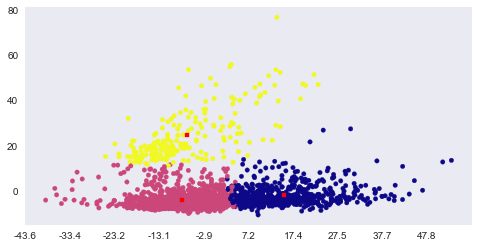

Kmeans, using 5 clusters


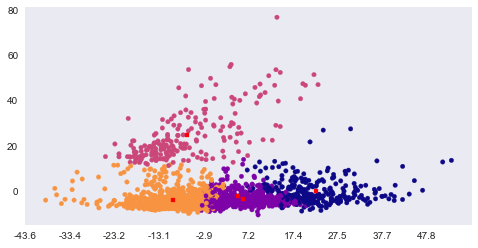

()

In [86]:
kmeansgapstats(E8gata56KDfilt)

/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


Kmeans is done using specified no. of clusters
For most sc-RNA seq data, PCA decomposition is done to first 20 or 50 components
No. of PCA components used 20
No. of cells used 1815
Explained variation per principal component [0.03848846 0.02231166 0.01239209 0.00785296 0.00571453 0.00437088
 0.0038877  0.003615   0.0035664  0.00311546 0.00284854 0.00244479
 0.00235433 0.00217715 0.00206151 0.0019597  0.00191895 0.00184819
 0.00168238 0.0015871 ]
Gaps Statistics Best value for k-means =  16


Best value for k-means =  16


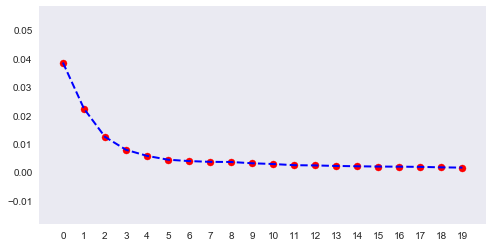

Kmeans, using 2 clusters


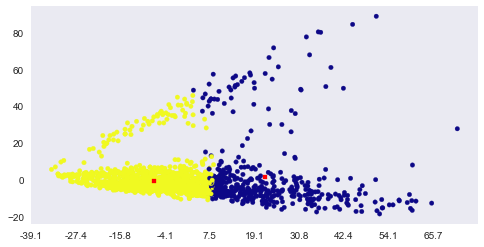

Kmeans, using 3 clusters


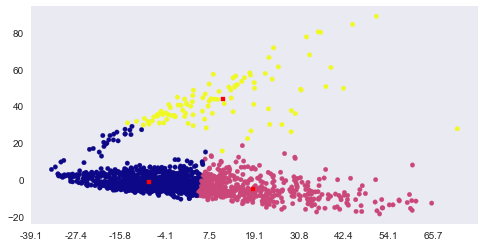

Kmeans, using 5 clusters


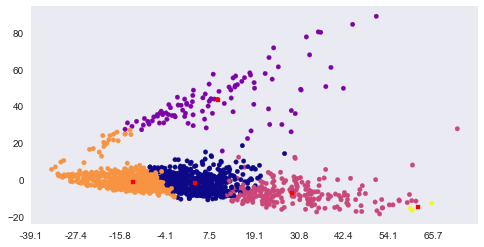

()

In [122]:
kmeansgapstats(E13gata56KDfilt)

In [108]:
def fancy_dendrogram(*args, **kwargs):
    from scipy.cluster.hierarchy import dendrogram, complete
    max_d = kwargs.pop('max_d', None)
    if max_d and 'color_threshold' not in kwargs:
        kwargs['color_threshold'] = max_d
    annotate_above = kwargs.pop('annotate_above', 0)

    ddata = dendrogram(*args, **kwargs)

    if not kwargs.get('no_plot', False):
        plt.title('Hierarchical Clustering Dendrogram (truncated)')
        plt.xlabel('sample index or (cluster size)')
        plt.ylabel('distance')
        for i, d, c in zip(ddata['icoord'], ddata['dcoord'], ddata['color_list']):
            x = 0.5 * sum(i[1:3])
            y = d[1]
            if y > annotate_above:
                plt.plot(x, y, 'o', c=c)
                plt.annotate("%.3g" % y, (x, y), xytext=(0, -5),
                             textcoords='offset points',
                             va='top', ha='center')
        if max_d:
            plt.axhline(y=max_d, c='k')
    return ddata 

In [114]:
def  tsneplots (transposed_data1, kmeansnclus): 
    import gap
    #Visualization with t-SNE
    transposed_data = StandardScaler().fit_transform(transposed_data1)
    from sklearn import manifold,datasets
    from sklearn.cluster import KMeans
    from sklearn.decomposition import PCA
    import scipy.stats as stats
    #Normalizing the data using standard scaler
    transposed_data = StandardScaler().fit_transform(transposed_data1)
   
 
    print ('Kmeans is done using specified no. of clusters')
    km = KMeans(n_clusters=kmeansnclus, init='k-means++',n_init=30, verbose=0);
    km.fit(transposed_data);
    cluster_pred = km.predict(transposed_data);
    print ('For most sc-RNA seq data, PCA decomposition is done to first 20 or 50 components')
    pca = PCA(n_components=50)
    pca.fit(transposed_data)
    X_pca = pca.transform(transposed_data)
    print ( 'No. of PCA components used', len(X_pca[0]))
    print ( 'No. of cells used' , len(X_pca) )
    print ('Explained variation per principal component' , pca.explained_variance_ratio_  )
    
    
    agbm= np.asarray(X_pca)
    gaps, s_k, K = gap.gap_statistic(agbm, refs=None, B=25, K=range(1,15), N_init = 25)
    bestKValue = gap.find_optimal_k(gaps, s_k, K)
    print ('best value for kmeans using Gap stats', bestKValue)
    plt.plot(gaps, 'o' )
    plt.plot(gaps, lw = '2')
    
    
    #Implementing Tsne on the sampledata
    n_components = 2
    X = X_pca
    (fig, subplots) = plt.subplots(4, sharex=True, figsize=(15, 15))
    perplexities = [ 25, 50, 75, 100]

    for i, perplexity in enumerate(perplexities):
        ax = subplots[i]

        t0 = time()
        tsne = manifold.TSNE(n_components=n_components, init='pca',n_iter= 1500, n_iter_without_progress=300 ,
                             random_state=0, perplexity=perplexity)
        Y = tsne.fit_transform(X)

        t1 = time()
        print("gbm-simulated data, perplexity=%g in %.2g sec" % (perplexity, t1 - t0))
        ax.set_title("Perplexity=%g" % perplexity)
        ax.scatter(Y[:, 0], Y[:, 1],c=cluster_pred,  cmap='gnuplot', s=20 )
        start, end = ax.get_xlim()
        ax.xaxis.set_ticks(np.arange(start, end, (end-start)/10))
        ax.xaxis.set_major_formatter(ticker.FormatStrFormatter('%0.1f'))
        ax.axis('tight')
        ax.grid()
        plt.show
    from scipy.cluster.hierarchy import dendrogram, complete
    #link_array = complete(sampleddata.T)
    link_array = complete(X_pca)    
    plt.figure(figsize=(25, 15))
    
    fancy_dendrogram(
    link_array,
    truncate_mode='lastp',
    p=50,
    leaf_rotation=90.,
    leaf_font_size=20,
    show_contracted=True,
    annotate_above=10,  # useful in small plots so annotations don't overlap
    max_d=100,
                    )
    plt.show()
    
    last = link_array[-10:, 2]
    last_rev = last[::-1]
    idxs = np.arange(1, len(last)+1 )
    plt.plot(idxs, last_rev ,  'o')
    plt.plot(idxs, last_rev , lw = '2')
    acceleration = np.diff(last, 2)  # 2nd derivative of the distances
    acceleration_rev = acceleration[::-1]
    plt.plot(idxs[:-2] + 1, acceleration_rev, 'o' )
    plt.plot(idxs[:-2] + 1, acceleration_rev,  lw  = '2' )
    plt.show()
    k = acceleration_rev.argmax() + 2  # if idx 0 is the max of this we want 2 clusters
    print ("clusters:", k)
    return ()

/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


Kmeans is done using specified no. of clusters
For most sc-RNA seq data, PCA decomposition is done to first 20 or 50 components
No. of PCA components used 50
No. of cells used 873
Explained variation per principal component [0.05899415 0.01162983 0.00842757 0.0067728  0.005867   0.00362961
 0.00351122 0.00333585 0.00294363 0.00287912 0.00280558 0.00269106
 0.0026163  0.00258789 0.00255576 0.00250055 0.0024734  0.00245929
 0.00243612 0.00242022 0.002412   0.00239117 0.0023676  0.00235099
 0.00234034 0.00232805 0.00232435 0.00230233 0.0022783  0.00226066
 0.00223894 0.0022285  0.00221514 0.00220569 0.00218279 0.00217137
 0.00215112 0.00214967 0.00213598 0.00212185 0.00210442 0.00209133
 0.00207779 0.00206959 0.00206523 0.00205052 0.00203626 0.00203338
 0.00200242 0.00199798]
best value for kmeans using Gap stats 5
gbm-simulated data, perplexity=25 in 25 sec
gbm-simulated data, perplexity=50 in 34 sec
gbm-simulated data, perplexity=75 in 40 sec
gbm-simulated data, perplexity=100 in 59 sec

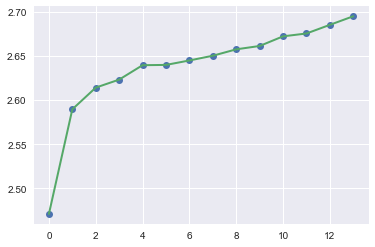

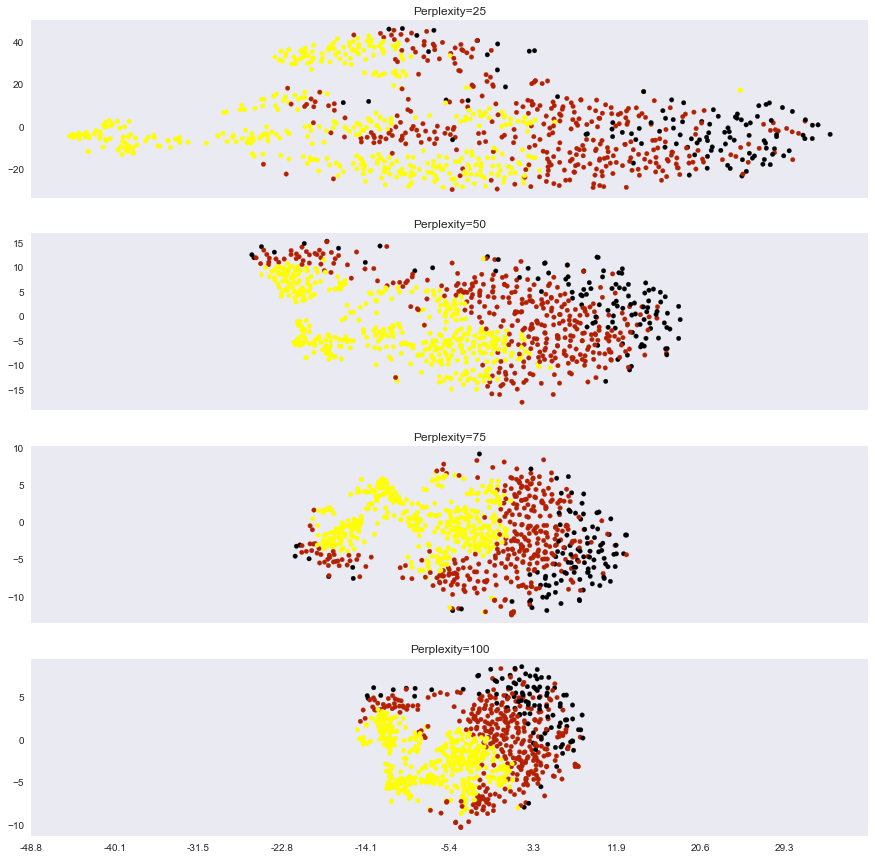

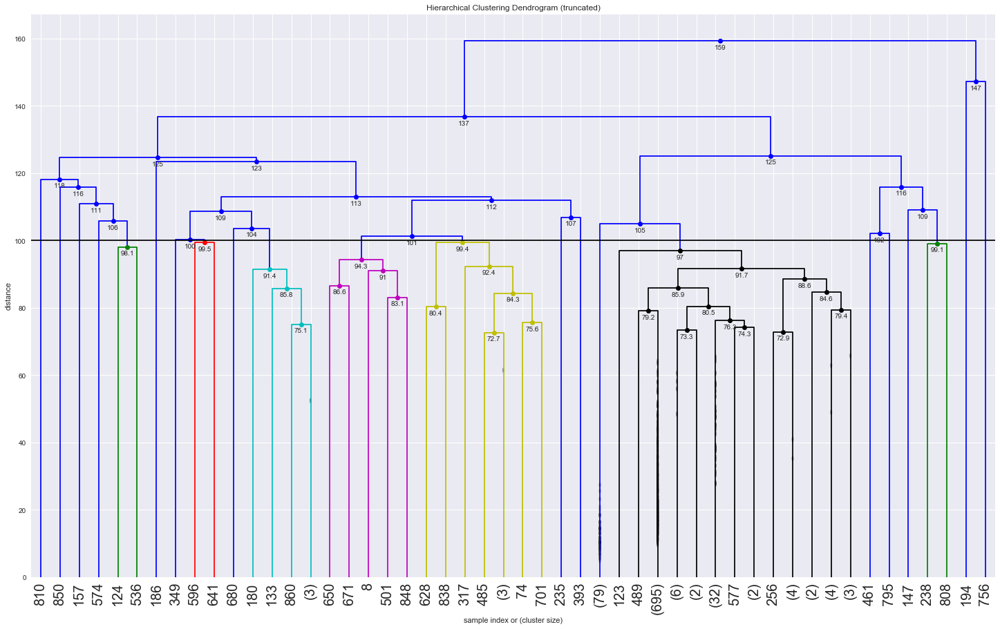

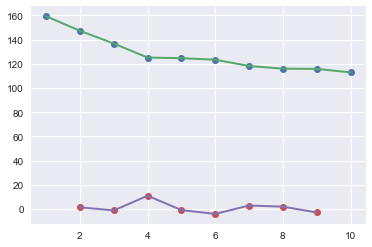

clusters: 4


()

In [116]:
tsneplots(E6WTfilt,3)

/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


Kmeans is done using specified no. of clusters
For most sc-RNA seq data, PCA decomposition is done to first 20 or 50 components
No. of PCA components used 50
No. of cells used 1499
Explained variation per principal component [0.05898959 0.01512487 0.00774271 0.00545919 0.00458492 0.00306248
 0.00288684 0.00257287 0.00238649 0.00228936 0.00222036 0.00219431
 0.00206237 0.0020034  0.00199227 0.00196254 0.00191151 0.0019076
 0.00188235 0.00186853 0.00186236 0.00185025 0.00182524 0.00178954
 0.00177334 0.00177004 0.00175772 0.00173885 0.00173603 0.00171626
 0.00170707 0.00169475 0.0016929  0.00168548 0.00166847 0.00165452
 0.00163718 0.00162963 0.00161219 0.00160978 0.00160052 0.00158271
 0.00157558 0.00156212 0.00155487 0.00154017 0.00152834 0.00152156
 0.0015107  0.00149879]
best value for kmeans using Gap stats 14
gbm-simulated data, perplexity=25 in 40 sec
gbm-simulated data, perplexity=50 in 59 sec
gbm-simulated data, perplexity=75 in 77 sec
gbm-simulated data, perplexity=100 in 93 se

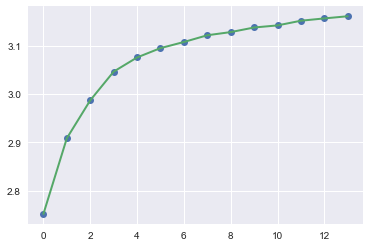

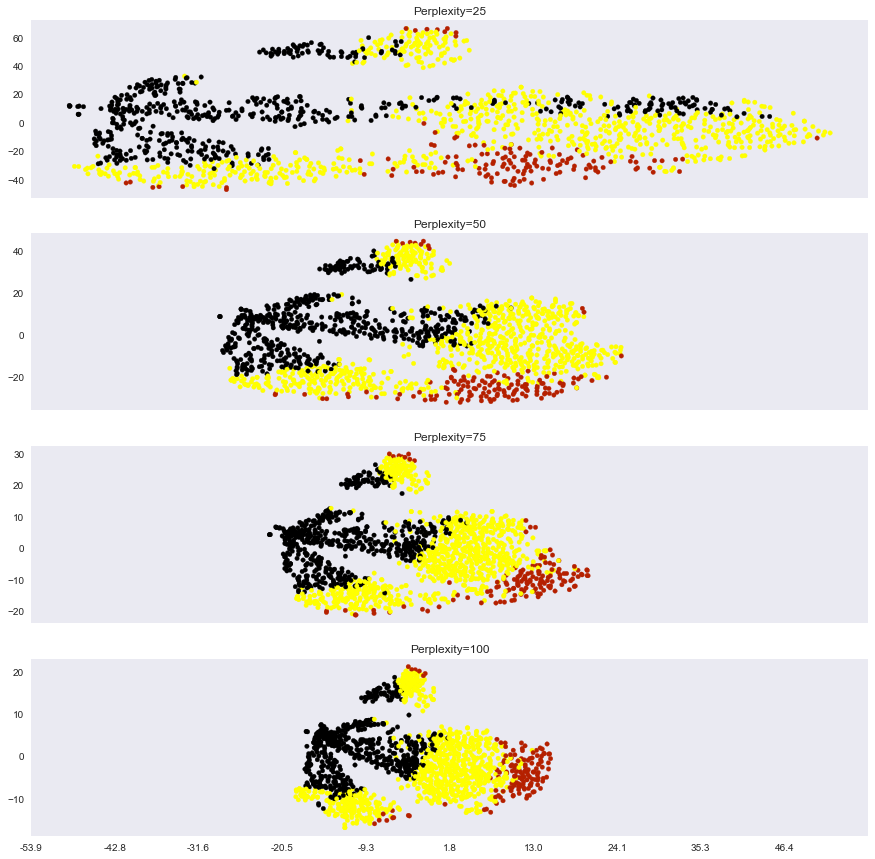

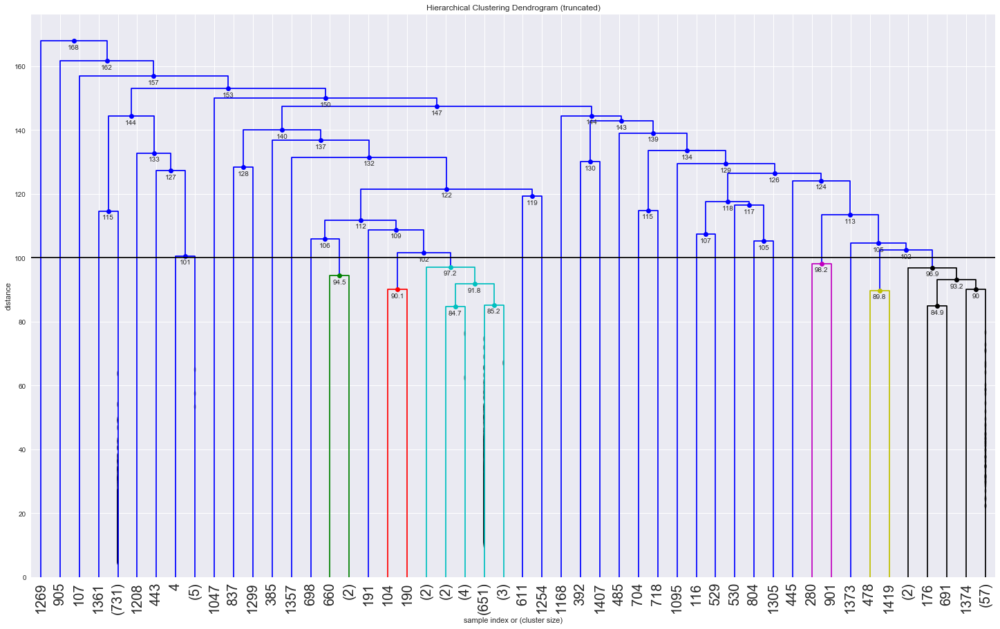

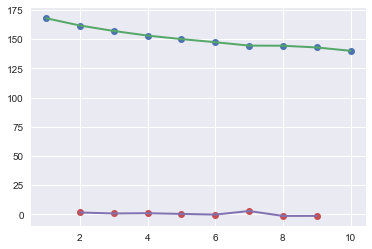

clusters: 7


()

In [117]:
tsneplots(E8WTfilt,3)

/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


Kmeans is done using specified no. of clusters
For most sc-RNA seq data, PCA decomposition is done to first 20 or 50 components
No. of PCA components used 50
No. of cells used 1431
Explained variation per principal component [0.04380174 0.02170953 0.00926619 0.00714238 0.00518742 0.00429786
 0.00396917 0.00319868 0.00310777 0.00302433 0.00267697 0.00261345
 0.00241524 0.00219888 0.00210765 0.00206515 0.00198483 0.00189188
 0.0018757  0.00181059 0.00180524 0.00178155 0.00175482 0.00171925
 0.00169483 0.00169139 0.00165586 0.00164543 0.00163387 0.00162362
 0.00161147 0.00159109 0.00158201 0.00157483 0.00156529 0.00155671
 0.00154388 0.00153405 0.00152306 0.0015159  0.0015105  0.0014969
 0.00149245 0.00148394 0.00146786 0.00146331 0.00145095 0.00144438
 0.00144249 0.00142935]
best value for kmeans using Gap stats 14
gbm-simulated data, perplexity=25 in 37 sec
gbm-simulated data, perplexity=50 in 52 sec
gbm-simulated data, perplexity=75 in 74 sec
gbm-simulated data, perplexity=100 in 92 se

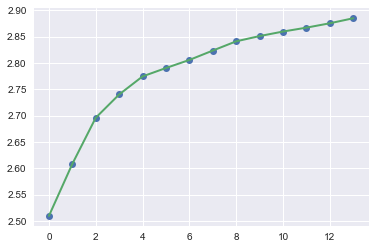

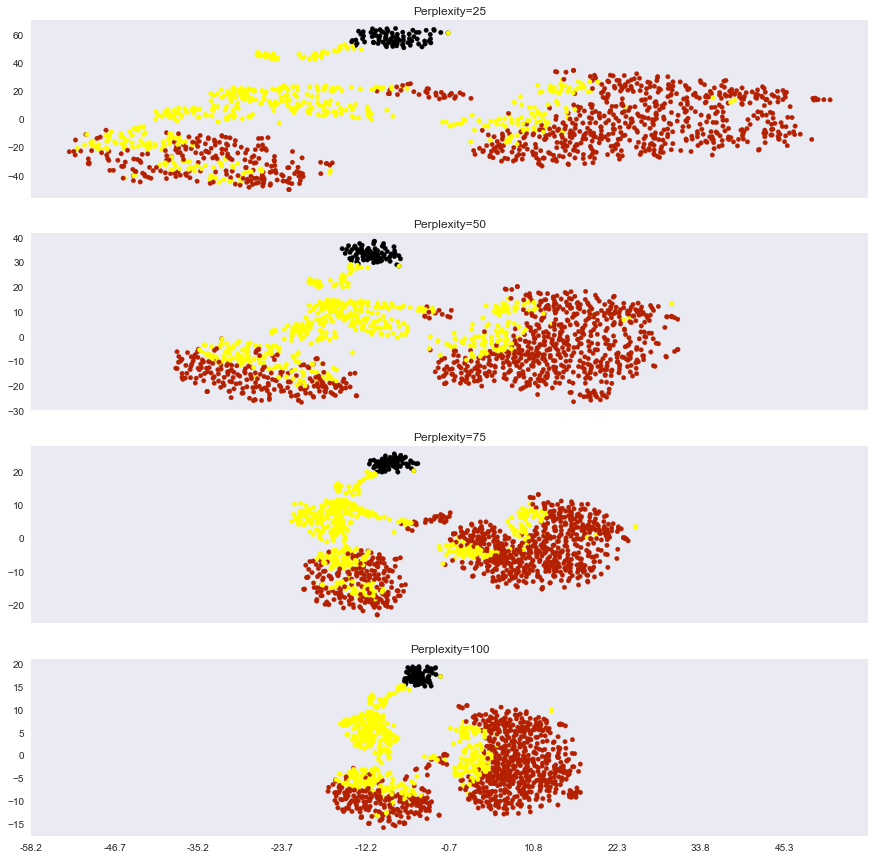

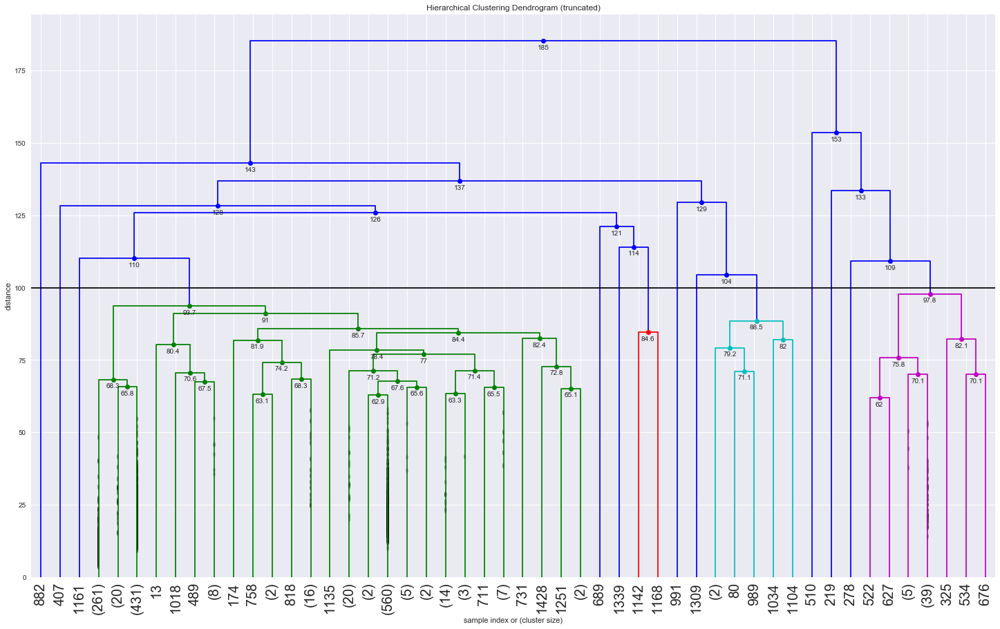

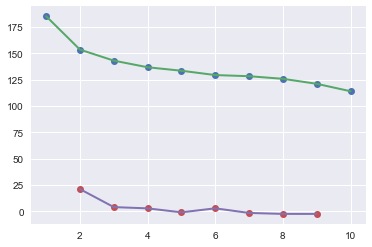

clusters: 2


()

In [118]:
tsneplots(E10WTfilt,3)

/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


Kmeans is done using specified no. of clusters
For most sc-RNA seq data, PCA decomposition is done to first 20 or 50 components
No. of PCA components used 50
No. of cells used 1522
Explained variation per principal component [0.04614932 0.01923424 0.01369249 0.00842176 0.0077069  0.00561166
 0.005253   0.00463556 0.00391863 0.00388098 0.00337324 0.00315992
 0.00269296 0.00262178 0.00233174 0.00229347 0.00221885 0.00208325
 0.00198389 0.00188869 0.00185809 0.00185126 0.00173826 0.0017007
 0.00168046 0.00162174 0.00158298 0.00155014 0.00154584 0.0015368
 0.00151178 0.00150271 0.00149226 0.00148311 0.00146818 0.00146589
 0.00145925 0.00144864 0.00144565 0.00143894 0.00143404 0.00142133
 0.00141711 0.00140316 0.00140148 0.00138566 0.00137916 0.0013713
 0.00135714 0.00135465]
best value for kmeans using Gap stats 14
gbm-simulated data, perplexity=25 in 42 sec
gbm-simulated data, perplexity=50 in 61 sec
gbm-simulated data, perplexity=75 in 81 sec
gbm-simulated data, perplexity=100 in 1.1e+02

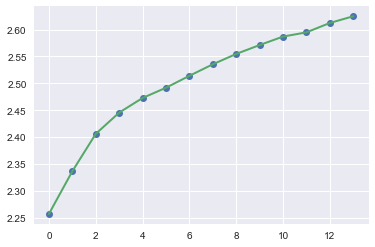

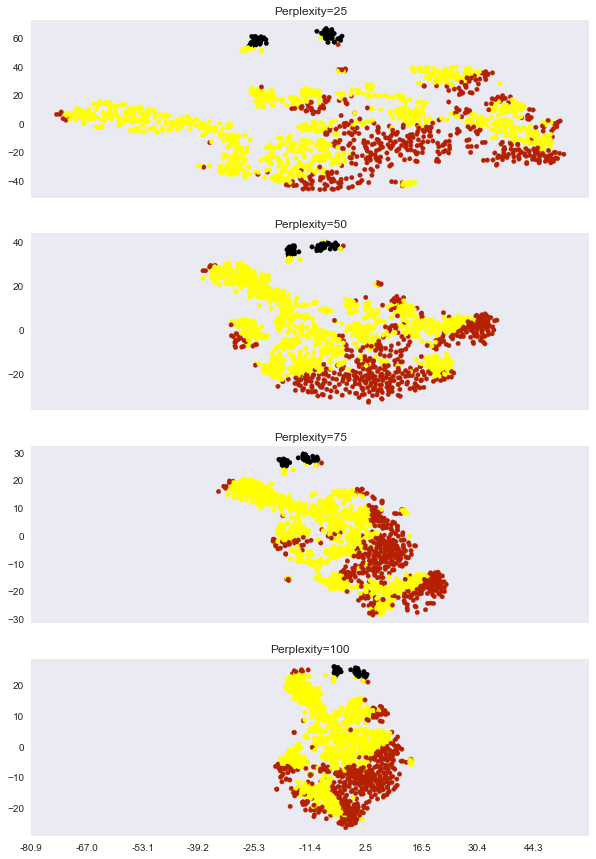

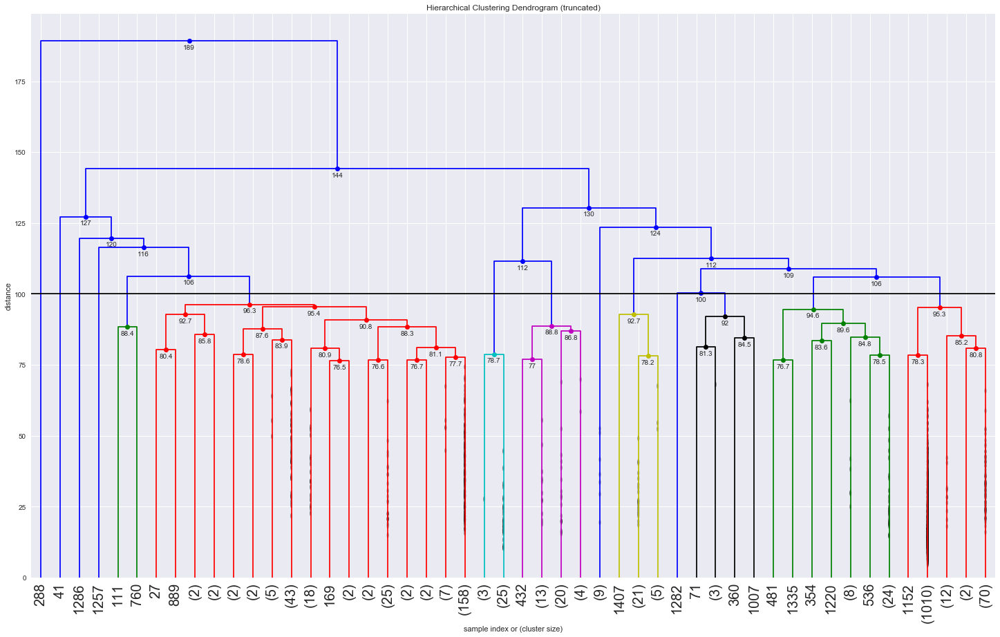

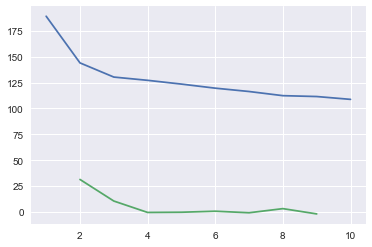

clusters: 2


()

In [112]:
tsneplots(E13WTfilt,3)

/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


Kmeans is done using specified no. of clusters
For most sc-RNA seq data, PCA decomposition is done to first 20 or 50 components
No. of PCA components used 50
No. of cells used 1522
Explained variation per principal component [0.04614932 0.01923424 0.01369249 0.00842176 0.0077069  0.00561166
 0.005253   0.00463556 0.00391863 0.00388098 0.00337324 0.00315992
 0.00269294 0.00262177 0.00233145 0.00229331 0.00222101 0.00208397
 0.00198747 0.00189424 0.00185179 0.00184759 0.00174475 0.0017083
 0.00166431 0.00159356 0.00158129 0.0015571  0.00154235 0.00152667
 0.00151036 0.00150891 0.00150129 0.00149382 0.00148015 0.00147185
 0.00146484 0.00145527 0.00144299 0.00144013 0.00143409 0.00141905
 0.00141686 0.00140966 0.00139255 0.00138922 0.00137651 0.00137226
 0.00136603 0.0013638 ]
best value for kmeans using Gap stats 14
gbm-simulated data, perplexity=25 in 40 sec
gbm-simulated data, perplexity=50 in 58 sec
gbm-simulated data, perplexity=75 in 82 sec
gbm-simulated data, perplexity=100 in 1.1e+

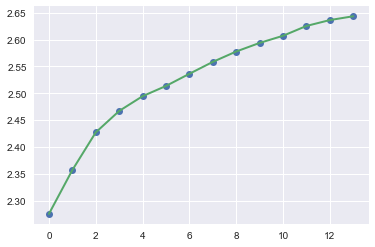

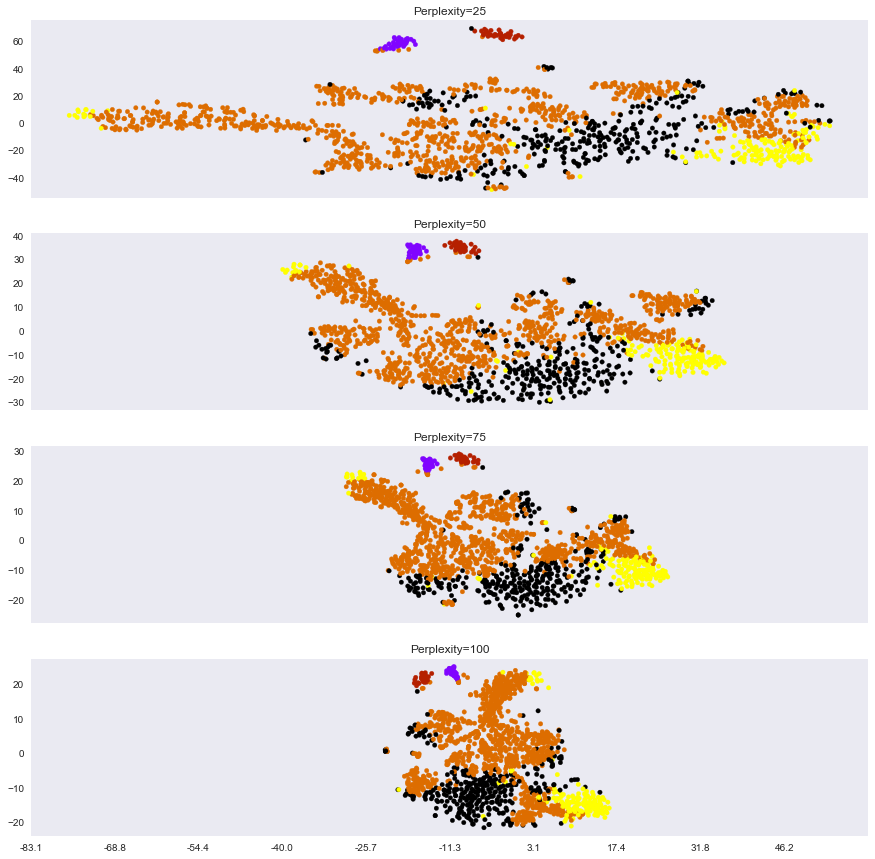

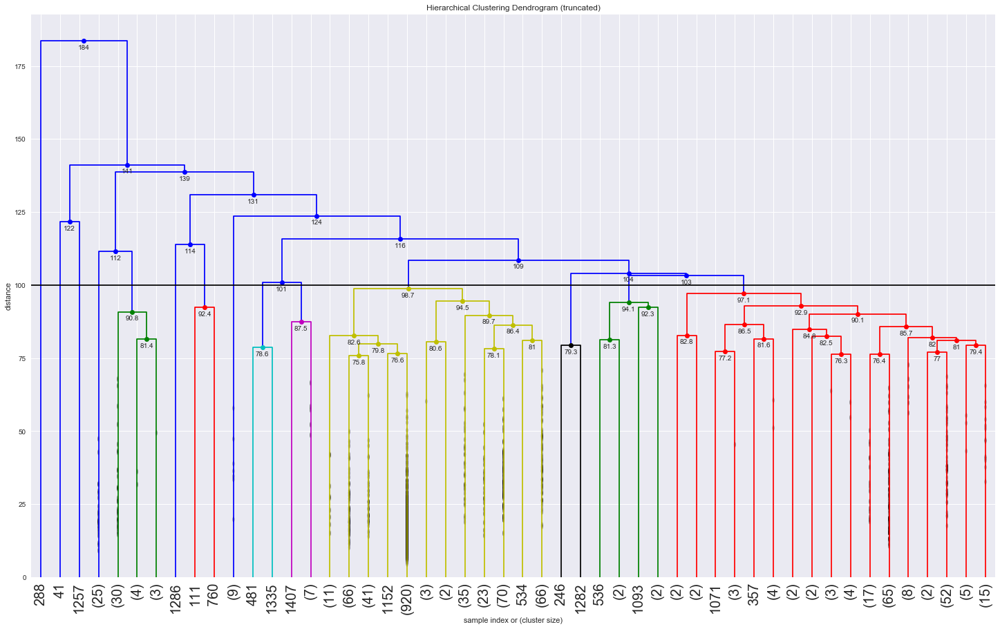

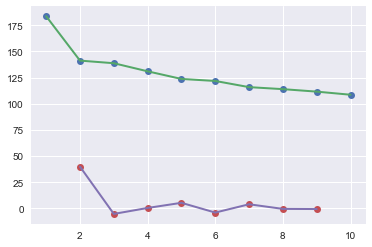

clusters: 2


()

In [115]:
tsneplots(E13WTfilt,5)

/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


Kmeans is done using specified no. of clusters
For most sc-RNA seq data, PCA decomposition is done to first 20 or 50 components
No. of PCA components used 50
No. of cells used 1848
Explained variation per principal component [0.02481649 0.01466589 0.00660397 0.00627257 0.00554361 0.00371293
 0.00350052 0.00284085 0.0025143  0.00232071 0.00215359 0.00200791
 0.00180555 0.00173816 0.00164436 0.00160074 0.00143528 0.00142023
 0.00137747 0.00136247 0.0013494  0.0013388  0.00129119 0.00127873
 0.00126517 0.00126107 0.00125498 0.00124543 0.0012314  0.00122706
 0.00121138 0.00120443 0.00119797 0.00119359 0.00118884 0.00118478
 0.00117651 0.00117243 0.00116805 0.00115734 0.00115566 0.00115024
 0.00114529 0.00114306 0.00113227 0.00112439 0.00112072 0.00111843
 0.00111123 0.00110361]
best value for kmeans using Gap stats 12
gbm-simulated data, perplexity=25 in 53 sec
gbm-simulated data, perplexity=50 in 74 sec
gbm-simulated data, perplexity=75 in 1e+02 sec
gbm-simulated data, perplexity=100 in 1

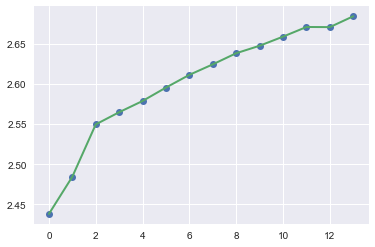

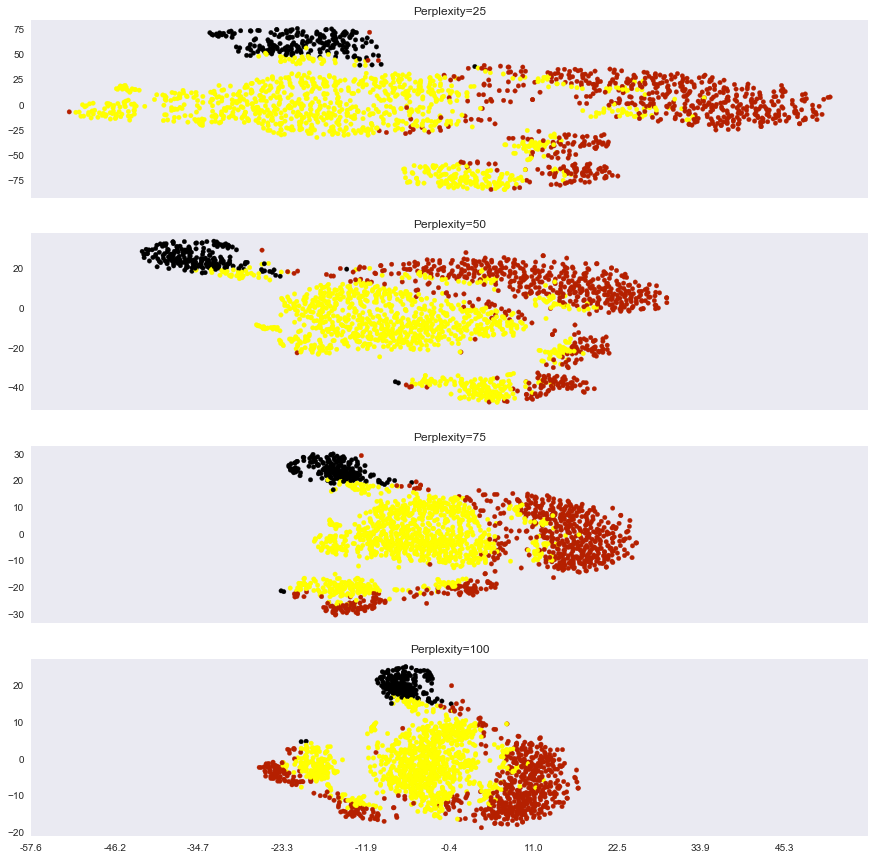

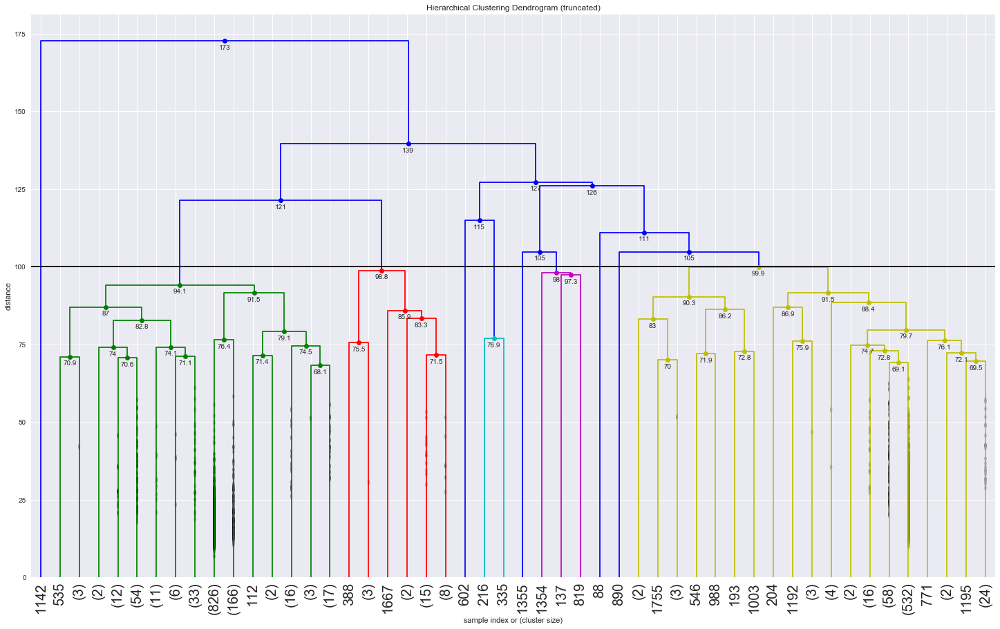

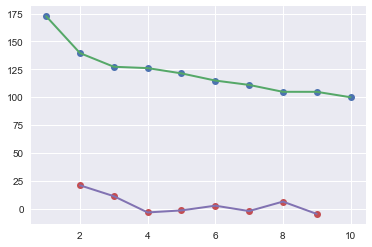

clusters: 2


()

In [119]:
tsneplots(E8gata56KDfilt,3)

/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/anaconda3/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int64 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


Kmeans is done using specified no. of clusters
For most sc-RNA seq data, PCA decomposition is done to first 20 or 50 components
No. of PCA components used 50
No. of cells used 1815
Explained variation per principal component [0.03848846 0.02231166 0.01239209 0.00785296 0.00571453 0.00437088
 0.00388771 0.00361501 0.00356641 0.0031155  0.00284861 0.00244562
 0.00235484 0.00217935 0.00207299 0.00198172 0.00192989 0.00187247
 0.00173738 0.00169044 0.00161591 0.0015854  0.00155673 0.00153645
 0.00152249 0.00150351 0.00148983 0.00147237 0.00145775 0.00144177
 0.0014342  0.001424   0.00140359 0.00138954 0.00138734 0.00137392
 0.00136525 0.00135238 0.00134013 0.0013323  0.00132367 0.00131674
 0.00131249 0.00130885 0.00130385 0.00129125 0.00128006 0.00127295
 0.00126859 0.00125829]
best value for kmeans using Gap stats 14
gbm-simulated data, perplexity=25 in 51 sec
gbm-simulated data, perplexity=50 in 75 sec
gbm-simulated data, perplexity=75 in 99 sec
gbm-simulated data, perplexity=100 in 1.2e

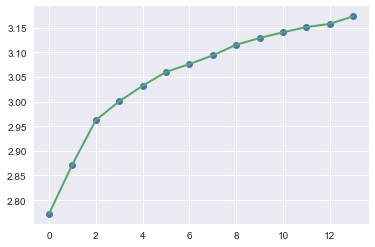

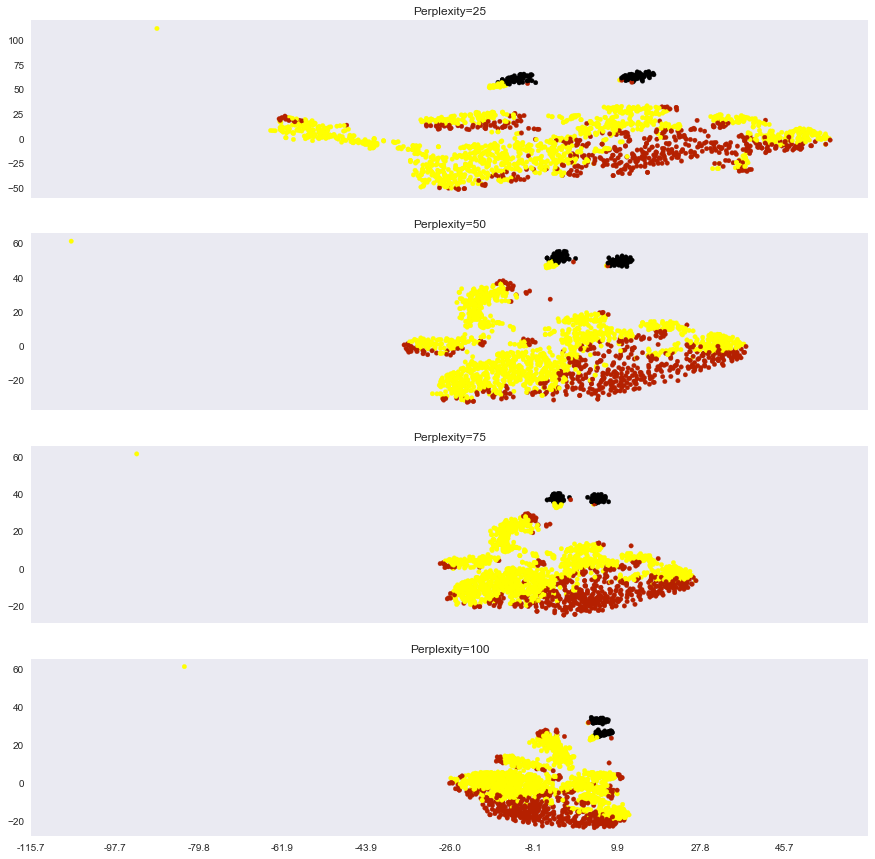

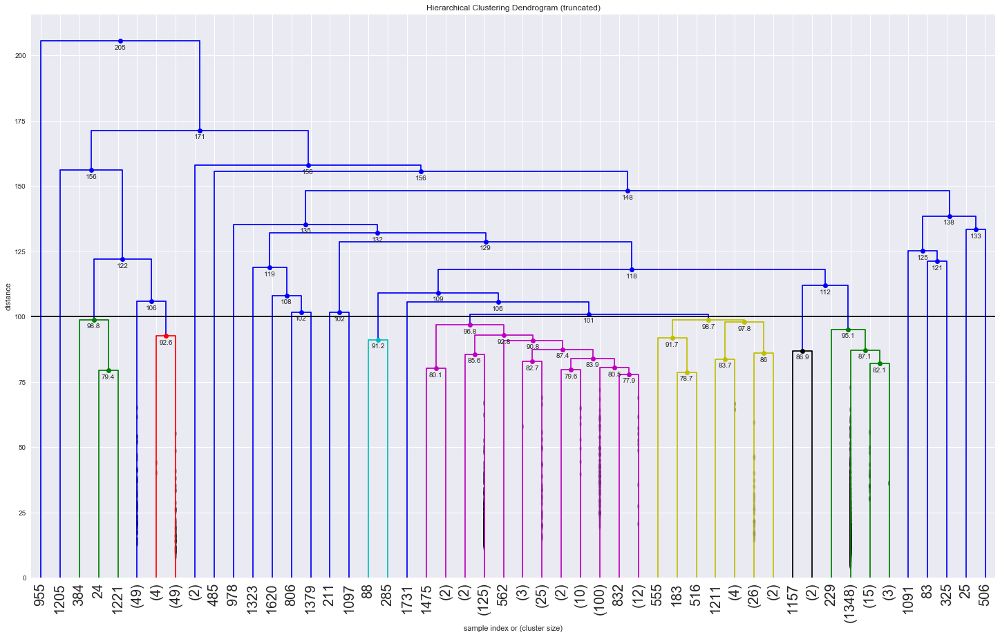

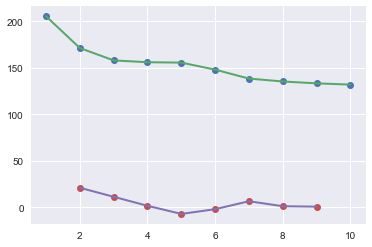

clusters: 2


()

In [123]:
tsneplots(E13gata56KDfilt,3)